# 🧱 DCGAN - Bricks Data

In this notebook, we'll walk through the steps required to train your own DCGAN on the bricks dataset

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    losses,
    utils,
    metrics,
    optimizers,
)

from utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
CHANNELS = 1
BATCH_SIZE = 128
Z_DIM = 100
EPOCHS = 300
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
LEARNING_RATE = 0.0002
NOISE_PARAM = 0.1

## 1. Prepare the data <a name="prepare"></a>

In [3]:
train_data = utils.image_dataset_from_directory(
    "../../../data/lego-brick-images/dataset/",
    labels=None,
    color_mode="grayscale",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 40000 files belonging to 1 classes.
Metal device set to: Apple M3 Max

systemMemory: 64.00 GB
maxCacheSize: 24.00 GB



2024-05-15 15:09:59.899267: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-15 15:09:59.899453: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [5]:
train_sample = sample_batch(train)

2024-05-15 15:10:00.024875: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


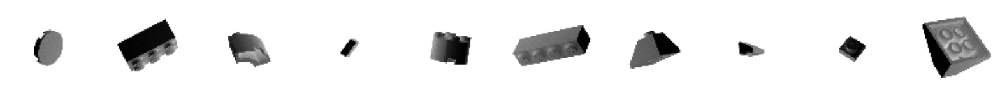

In [6]:
display(train_sample)

## 2. Build the GAN <a name="build"></a>

In [7]:
discriminator_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", use_bias=False)(
    discriminator_input
)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    512, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(
    1,
    kernel_size=4,
    strides=1,
    padding="valid",
    use_bias=False,
    activation="sigmoid",
)(x)
discriminator_output = layers.Flatten()(x)

discriminator = models.Model(discriminator_input, discriminator_output)
discriminator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        1024      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 128)      512       
 ormalization)                                                   
                                                             

In [8]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS,
    kernel_size=4,
    strides=2,
    padding="same",
    use_bias=False,
    activation="tanh",
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_3 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097

In [9]:
class DCGAN(models.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer):
        super(DCGAN, self).compile()
        self.loss_fn = losses.BinaryCrossentropy()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_metric = metrics.Mean(name="d_loss")
        self.d_real_acc_metric = metrics.BinaryAccuracy(name="d_real_acc")
        self.d_fake_acc_metric = metrics.BinaryAccuracy(name="d_fake_acc")
        self.d_acc_metric = metrics.BinaryAccuracy(name="d_acc")
        self.g_loss_metric = metrics.Mean(name="g_loss")
        self.g_acc_metric = metrics.BinaryAccuracy(name="g_acc")

    @property
    def metrics(self):
        return [
            self.d_loss_metric,
            self.d_real_acc_metric,
            self.d_fake_acc_metric,
            self.d_acc_metric,
            self.g_loss_metric,
            self.g_acc_metric,
        ]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        # Train the discriminator on fake images
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = self.generator(
                random_latent_vectors, training=True
            )
            real_predictions = self.discriminator(real_images, training=True)
            fake_predictions = self.discriminator(
                generated_images, training=True
            )

            real_labels = tf.ones_like(real_predictions)
            real_noisy_labels = real_labels + NOISE_PARAM * tf.random.uniform(
                tf.shape(real_predictions)
            )
            fake_labels = tf.zeros_like(fake_predictions)
            fake_noisy_labels = fake_labels - NOISE_PARAM * tf.random.uniform(
                tf.shape(fake_predictions)
            )

            d_real_loss = self.loss_fn(real_noisy_labels, real_predictions)
            d_fake_loss = self.loss_fn(fake_noisy_labels, fake_predictions)
            d_loss = (d_real_loss + d_fake_loss) / 2.0

            g_loss = self.loss_fn(real_labels, fake_predictions)

        gradients_of_discriminator = disc_tape.gradient(
            d_loss, self.discriminator.trainable_variables
        )
        gradients_of_generator = gen_tape.gradient(
            g_loss, self.generator.trainable_variables
        )

        self.d_optimizer.apply_gradients(
            zip(gradients_of_discriminator, discriminator.trainable_variables)
        )
        self.g_optimizer.apply_gradients(
            zip(gradients_of_generator, generator.trainable_variables)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.d_real_acc_metric.update_state(real_labels, real_predictions)
        self.d_fake_acc_metric.update_state(fake_labels, fake_predictions)
        self.d_acc_metric.update_state(
            [real_labels, fake_labels], [real_predictions, fake_predictions]
        )
        self.g_loss_metric.update_state(g_loss)
        self.g_acc_metric.update_state(real_labels, fake_predictions)

        return {m.name: m.result() for m in self.metrics}

In [10]:
# Create a DCGAN
dcgan = DCGAN(
    discriminator=discriminator, generator=generator, latent_dim=Z_DIM
)

In [11]:
if LOAD_MODEL:
    dcgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [12]:
dcgan.compile(
    d_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [13]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )

Epoch 1/300


2024-05-15 15:10:04.373982: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


313/313 [==============================] - ETA: 0s - d_loss: 0.7664 - d_real_acc: 0.6001 - d_fake_acc: 0.6043 - d_acc: 0.6022 - g_loss: 1.1861 - g_acc: 0.3957
Saved to ./output/generated_img_000.png


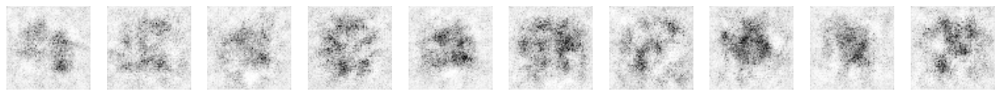

313/313 [==============================] - 31s 85ms/step - d_loss: 0.7664 - d_real_acc: 0.6001 - d_fake_acc: 0.6043 - d_acc: 0.6022 - g_loss: 1.1861 - g_acc: 0.3957
Epoch 2/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.5958 - d_real_acc: 0.6388 - d_fake_acc: 0.6745 - d_acc: 0.6567 - g_loss: 1.0426 - g_acc: 0.3255
Saved to ./output/generated_img_001.png


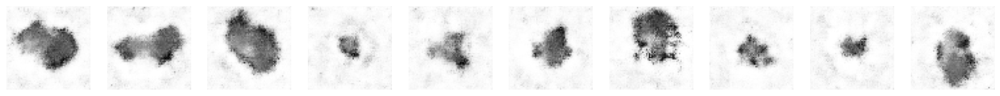

313/313 [==============================] - 26s 81ms/step - d_loss: 0.5958 - d_real_acc: 0.6385 - d_fake_acc: 0.6749 - d_acc: 0.6567 - g_loss: 1.0426 - g_acc: 0.3251
Epoch 3/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.5556 - d_real_acc: 0.6642 - d_fake_acc: 0.7085 - d_acc: 0.6864 - g_loss: 1.0955 - g_acc: 0.2915
Saved to ./output/generated_img_002.png


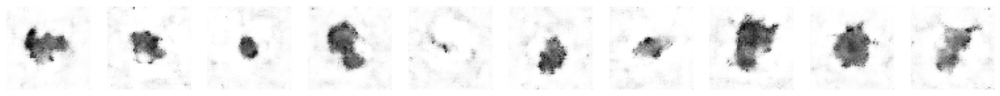

313/313 [==============================] - 26s 82ms/step - d_loss: 0.5554 - d_real_acc: 0.6639 - d_fake_acc: 0.7090 - d_acc: 0.6864 - g_loss: 1.0978 - g_acc: 0.2910
Epoch 4/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.5269 - d_real_acc: 0.6818 - d_fake_acc: 0.7208 - d_acc: 0.7013 - g_loss: 1.1618 - g_acc: 0.2792
Saved to ./output/generated_img_003.png


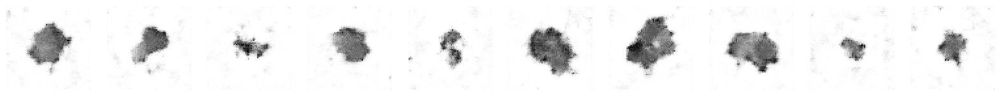

313/313 [==============================] - 27s 85ms/step - d_loss: 0.5268 - d_real_acc: 0.6821 - d_fake_acc: 0.7204 - d_acc: 0.7012 - g_loss: 1.1602 - g_acc: 0.2797
Epoch 5/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.5165 - d_real_acc: 0.6881 - d_fake_acc: 0.7368 - d_acc: 0.7124 - g_loss: 1.2150 - g_acc: 0.2632
Saved to ./output/generated_img_004.png


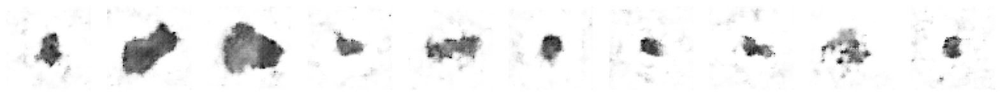

313/313 [==============================] - 27s 85ms/step - d_loss: 0.5163 - d_real_acc: 0.6884 - d_fake_acc: 0.7363 - d_acc: 0.7124 - g_loss: 1.2134 - g_acc: 0.2637
Epoch 6/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.5017 - d_real_acc: 0.6964 - d_fake_acc: 0.7531 - d_acc: 0.7248 - g_loss: 1.2588 - g_acc: 0.2469
Saved to ./output/generated_img_005.png


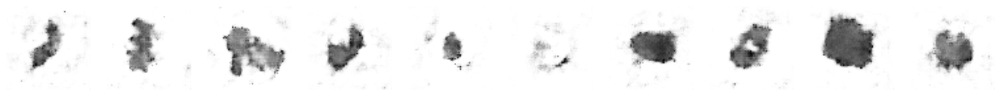

313/313 [==============================] - 27s 86ms/step - d_loss: 0.5020 - d_real_acc: 0.6967 - d_fake_acc: 0.7523 - d_acc: 0.7245 - g_loss: 1.2565 - g_acc: 0.2477
Epoch 7/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4939 - d_real_acc: 0.7024 - d_fake_acc: 0.7593 - d_acc: 0.7308 - g_loss: 1.2799 - g_acc: 0.2407
Saved to ./output/generated_img_006.png


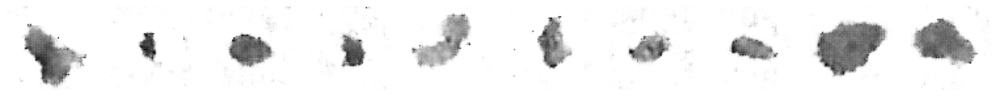

313/313 [==============================] - 29s 91ms/step - d_loss: 0.4939 - d_real_acc: 0.7024 - d_fake_acc: 0.7593 - d_acc: 0.7308 - g_loss: 1.2799 - g_acc: 0.2407
Epoch 8/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4566 - d_real_acc: 0.7213 - d_fake_acc: 0.7932 - d_acc: 0.7572 - g_loss: 1.3313 - g_acc: 0.2068
Saved to ./output/generated_img_007.png


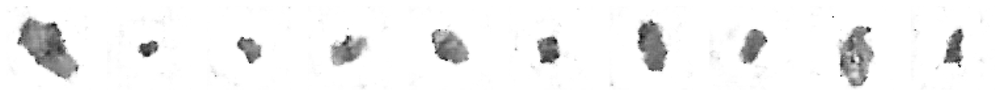

313/313 [==============================] - 30s 95ms/step - d_loss: 0.4566 - d_real_acc: 0.7213 - d_fake_acc: 0.7932 - d_acc: 0.7572 - g_loss: 1.3313 - g_acc: 0.2068
Epoch 9/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4477 - d_real_acc: 0.7228 - d_fake_acc: 0.7847 - d_acc: 0.7537 - g_loss: 1.3795 - g_acc: 0.2153
Saved to ./output/generated_img_008.png


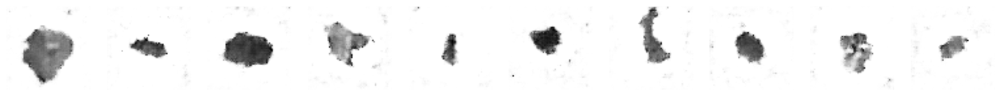

313/313 [==============================] - 31s 98ms/step - d_loss: 0.4477 - d_real_acc: 0.7228 - d_fake_acc: 0.7847 - d_acc: 0.7537 - g_loss: 1.3795 - g_acc: 0.2153
Epoch 10/300
313/313 [==============================] - ETA: 0s - d_loss: 0.4105 - d_real_acc: 0.7448 - d_fake_acc: 0.8285 - d_acc: 0.7866 - g_loss: 1.5005 - g_acc: 0.1716
Saved to ./output/generated_img_009.png


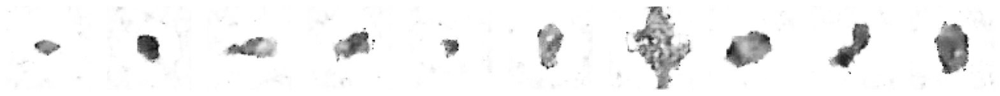

313/313 [==============================] - 31s 98ms/step - d_loss: 0.4105 - d_real_acc: 0.7448 - d_fake_acc: 0.8285 - d_acc: 0.7866 - g_loss: 1.5005 - g_acc: 0.1716
Epoch 11/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3810 - d_real_acc: 0.7575 - d_fake_acc: 0.8384 - d_acc: 0.7980 - g_loss: 1.5322 - g_acc: 0.1616
Saved to ./output/generated_img_010.png


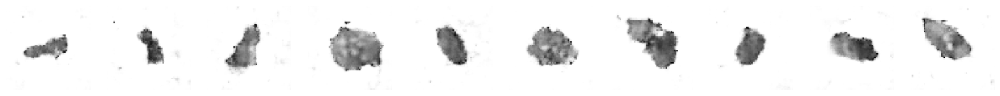

313/313 [==============================] - 30s 96ms/step - d_loss: 0.3810 - d_real_acc: 0.7575 - d_fake_acc: 0.8384 - d_acc: 0.7980 - g_loss: 1.5322 - g_acc: 0.1616
Epoch 12/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3689 - d_real_acc: 0.7638 - d_fake_acc: 0.8424 - d_acc: 0.8031 - g_loss: 1.5945 - g_acc: 0.1576
Saved to ./output/generated_img_011.png


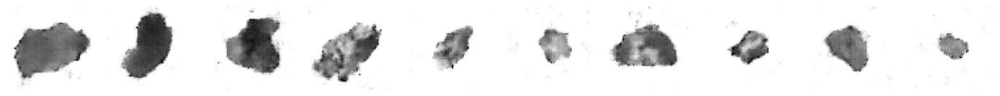

313/313 [==============================] - 30s 96ms/step - d_loss: 0.3689 - d_real_acc: 0.7638 - d_fake_acc: 0.8424 - d_acc: 0.8031 - g_loss: 1.5945 - g_acc: 0.1576
Epoch 13/300
313/313 [==============================] - ETA: 0s - d_loss: 0.3441 - d_real_acc: 0.7737 - d_fake_acc: 0.8463 - d_acc: 0.8100 - g_loss: 1.7033 - g_acc: 0.1537
Saved to ./output/generated_img_012.png


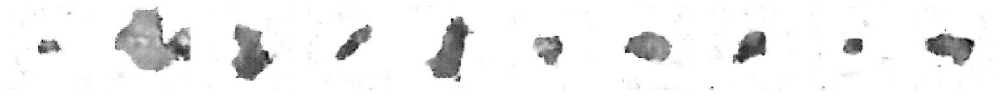

313/313 [==============================] - 30s 95ms/step - d_loss: 0.3441 - d_real_acc: 0.7737 - d_fake_acc: 0.8463 - d_acc: 0.8100 - g_loss: 1.7033 - g_acc: 0.1537
Epoch 14/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2984 - d_real_acc: 0.7972 - d_fake_acc: 0.8760 - d_acc: 0.8366 - g_loss: 1.8168 - g_acc: 0.1240
Saved to ./output/generated_img_013.png


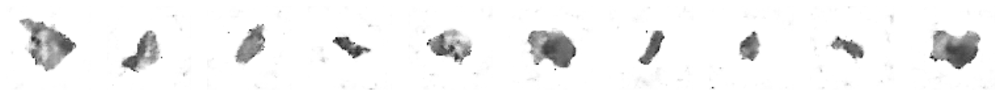

313/313 [==============================] - 30s 95ms/step - d_loss: 0.2984 - d_real_acc: 0.7972 - d_fake_acc: 0.8760 - d_acc: 0.8366 - g_loss: 1.8168 - g_acc: 0.1240
Epoch 15/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2919 - d_real_acc: 0.7977 - d_fake_acc: 0.8738 - d_acc: 0.8358 - g_loss: 1.8989 - g_acc: 0.1261
Saved to ./output/generated_img_014.png


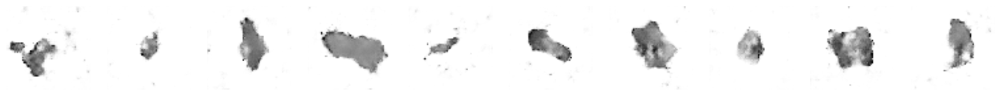

313/313 [==============================] - 30s 94ms/step - d_loss: 0.2919 - d_real_acc: 0.7977 - d_fake_acc: 0.8738 - d_acc: 0.8358 - g_loss: 1.8989 - g_acc: 0.1261
Epoch 16/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.2587 - d_real_acc: 0.8120 - d_fake_acc: 0.8898 - d_acc: 0.8509 - g_loss: 1.9973 - g_acc: 0.1102
Saved to ./output/generated_img_015.png


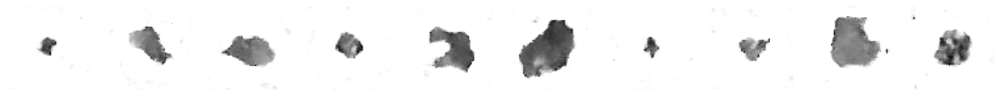

313/313 [==============================] - 30s 94ms/step - d_loss: 0.2586 - d_real_acc: 0.8122 - d_fake_acc: 0.8898 - d_acc: 0.8510 - g_loss: 1.9948 - g_acc: 0.1102
Epoch 17/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.2507 - d_real_acc: 0.8151 - d_fake_acc: 0.8859 - d_acc: 0.8505 - g_loss: 2.0867 - g_acc: 0.1141
Saved to ./output/generated_img_016.png


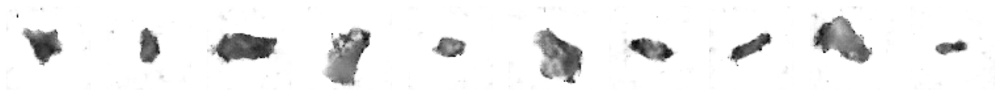

313/313 [==============================] - 30s 94ms/step - d_loss: 0.2506 - d_real_acc: 0.8151 - d_fake_acc: 0.8861 - d_acc: 0.8506 - g_loss: 2.0873 - g_acc: 0.1139
Epoch 18/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2210 - d_real_acc: 0.8238 - d_fake_acc: 0.8959 - d_acc: 0.8598 - g_loss: 2.1665 - g_acc: 0.1041
Saved to ./output/generated_img_017.png


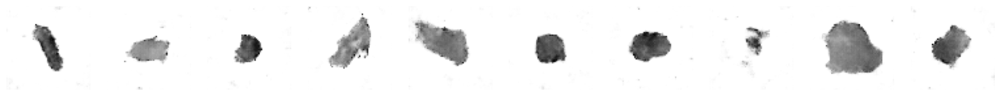

313/313 [==============================] - 30s 94ms/step - d_loss: 0.2210 - d_real_acc: 0.8238 - d_fake_acc: 0.8959 - d_acc: 0.8598 - g_loss: 2.1665 - g_acc: 0.1041
Epoch 19/300
313/313 [==============================] - ETA: 0s - d_loss: 0.2256 - d_real_acc: 0.8230 - d_fake_acc: 0.9008 - d_acc: 0.8619 - g_loss: 2.2011 - g_acc: 0.0992
Saved to ./output/generated_img_018.png


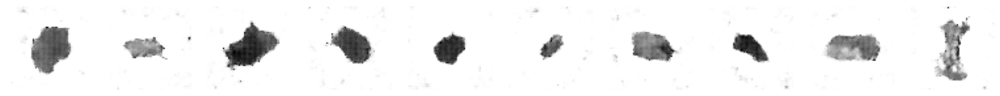

313/313 [==============================] - 30s 94ms/step - d_loss: 0.2256 - d_real_acc: 0.8230 - d_fake_acc: 0.9008 - d_acc: 0.8619 - g_loss: 2.2011 - g_acc: 0.0992
Epoch 20/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.1954 - d_real_acc: 0.8355 - d_fake_acc: 0.9037 - d_acc: 0.8696 - g_loss: 2.3293 - g_acc: 0.0963
Saved to ./output/generated_img_019.png


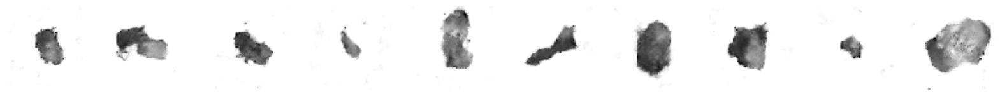

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1949 - d_real_acc: 0.8357 - d_fake_acc: 0.9038 - d_acc: 0.8697 - g_loss: 2.3282 - g_acc: 0.0962
Epoch 21/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.1819 - d_real_acc: 0.8354 - d_fake_acc: 0.9038 - d_acc: 0.8696 - g_loss: 2.4291 - g_acc: 0.0962
Saved to ./output/generated_img_020.png


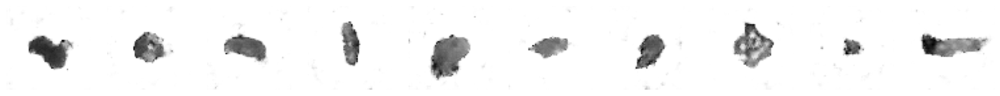

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1815 - d_real_acc: 0.8355 - d_fake_acc: 0.9039 - d_acc: 0.8697 - g_loss: 2.4280 - g_acc: 0.0961
Epoch 22/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1805 - d_real_acc: 0.8395 - d_fake_acc: 0.9043 - d_acc: 0.8719 - g_loss: 2.5072 - g_acc: 0.0957
Saved to ./output/generated_img_021.png


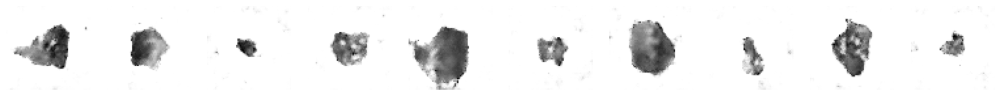

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1805 - d_real_acc: 0.8395 - d_fake_acc: 0.9043 - d_acc: 0.8719 - g_loss: 2.5072 - g_acc: 0.0957
Epoch 23/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1651 - d_real_acc: 0.8447 - d_fake_acc: 0.9133 - d_acc: 0.8790 - g_loss: 2.4846 - g_acc: 0.0867
Saved to ./output/generated_img_022.png


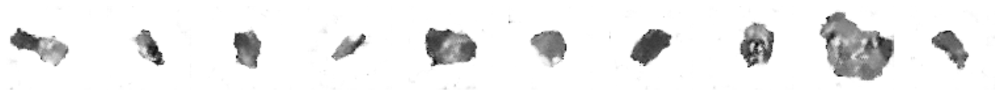

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1651 - d_real_acc: 0.8447 - d_fake_acc: 0.9133 - d_acc: 0.8790 - g_loss: 2.4846 - g_acc: 0.0867
Epoch 24/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.1359 - d_real_acc: 0.8509 - d_fake_acc: 0.9139 - d_acc: 0.8824 - g_loss: 2.6737 - g_acc: 0.0861
Saved to ./output/generated_img_023.png


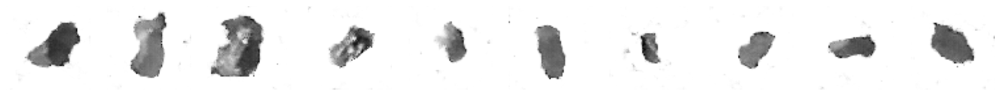

313/313 [==============================] - 30s 95ms/step - d_loss: 0.1358 - d_real_acc: 0.8508 - d_fake_acc: 0.9140 - d_acc: 0.8824 - g_loss: 2.6760 - g_acc: 0.0860
Epoch 25/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1378 - d_real_acc: 0.8516 - d_fake_acc: 0.9101 - d_acc: 0.8809 - g_loss: 2.7165 - g_acc: 0.0899
Saved to ./output/generated_img_024.png


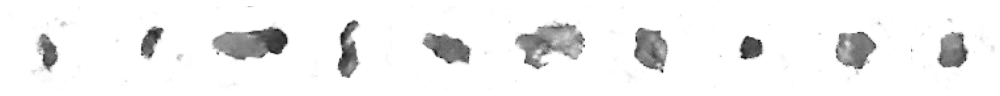

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1378 - d_real_acc: 0.8516 - d_fake_acc: 0.9101 - d_acc: 0.8809 - g_loss: 2.7165 - g_acc: 0.0899
Epoch 26/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.1359 - d_real_acc: 0.8523 - d_fake_acc: 0.9145 - d_acc: 0.8834 - g_loss: 2.7731 - g_acc: 0.0855
Saved to ./output/generated_img_025.png


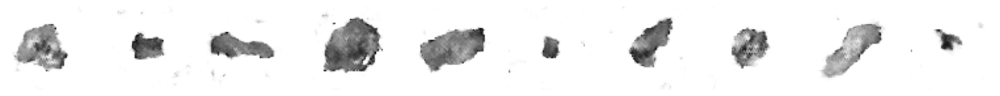

313/313 [==============================] - 30s 95ms/step - d_loss: 0.1360 - d_real_acc: 0.8521 - d_fake_acc: 0.9146 - d_acc: 0.8834 - g_loss: 2.7799 - g_acc: 0.0854
Epoch 27/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1003 - d_real_acc: 0.8617 - d_fake_acc: 0.9244 - d_acc: 0.8931 - g_loss: 2.8161 - g_acc: 0.0756
Saved to ./output/generated_img_026.png


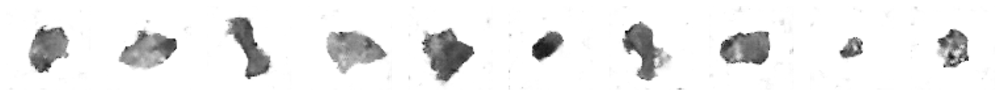

313/313 [==============================] - 30s 95ms/step - d_loss: 0.1003 - d_real_acc: 0.8617 - d_fake_acc: 0.9244 - d_acc: 0.8931 - g_loss: 2.8161 - g_acc: 0.0756
Epoch 28/300
313/313 [==============================] - ETA: 0s - d_loss: 0.1188 - d_real_acc: 0.8572 - d_fake_acc: 0.9141 - d_acc: 0.8857 - g_loss: 2.9368 - g_acc: 0.0859
Saved to ./output/generated_img_027.png


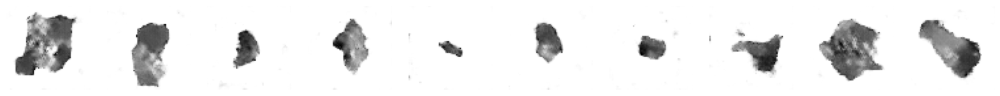

313/313 [==============================] - 30s 94ms/step - d_loss: 0.1188 - d_real_acc: 0.8572 - d_fake_acc: 0.9141 - d_acc: 0.8857 - g_loss: 2.9368 - g_acc: 0.0859
Epoch 29/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0996 - d_real_acc: 0.8641 - d_fake_acc: 0.9230 - d_acc: 0.8936 - g_loss: 2.9640 - g_acc: 0.0769
Saved to ./output/generated_img_028.png


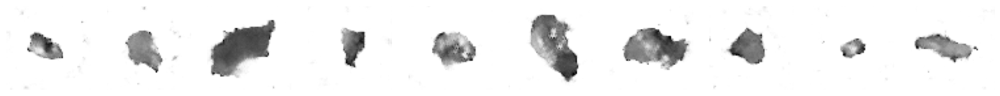

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0996 - d_real_acc: 0.8641 - d_fake_acc: 0.9230 - d_acc: 0.8936 - g_loss: 2.9640 - g_acc: 0.0769
Epoch 30/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0983 - d_real_acc: 0.8614 - d_fake_acc: 0.9172 - d_acc: 0.8893 - g_loss: 3.0816 - g_acc: 0.0828
Saved to ./output/generated_img_029.png


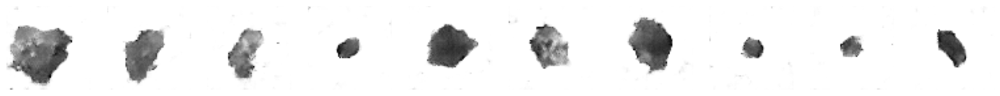

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0983 - d_real_acc: 0.8614 - d_fake_acc: 0.9172 - d_acc: 0.8893 - g_loss: 3.0816 - g_acc: 0.0828
Epoch 31/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0651 - d_real_acc: 0.8708 - d_fake_acc: 0.9257 - d_acc: 0.8982 - g_loss: 3.1344 - g_acc: 0.0743
Saved to ./output/generated_img_030.png


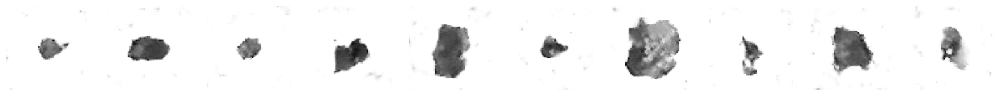

313/313 [==============================] - 30s 94ms/step - d_loss: 0.0651 - d_real_acc: 0.8708 - d_fake_acc: 0.9257 - d_acc: 0.8982 - g_loss: 3.1344 - g_acc: 0.0743
Epoch 32/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0715 - d_real_acc: 0.8674 - d_fake_acc: 0.9190 - d_acc: 0.8932 - g_loss: 3.2175 - g_acc: 0.0810
Saved to ./output/generated_img_031.png


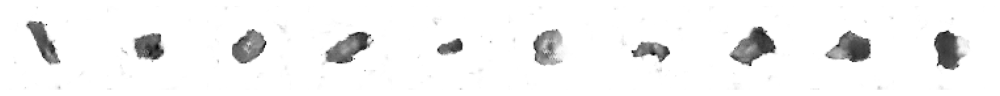

313/313 [==============================] - 30s 94ms/step - d_loss: 0.0715 - d_real_acc: 0.8674 - d_fake_acc: 0.9190 - d_acc: 0.8932 - g_loss: 3.2175 - g_acc: 0.0810
Epoch 33/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0515 - d_real_acc: 0.8738 - d_fake_acc: 0.9305 - d_acc: 0.9021 - g_loss: 3.2244 - g_acc: 0.0695
Saved to ./output/generated_img_032.png


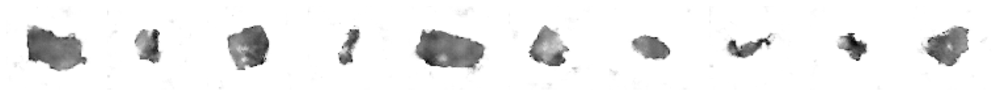

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0515 - d_real_acc: 0.8738 - d_fake_acc: 0.9305 - d_acc: 0.9021 - g_loss: 3.2244 - g_acc: 0.0695
Epoch 34/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0440 - d_real_acc: 0.8777 - d_fake_acc: 0.9299 - d_acc: 0.9038 - g_loss: 3.2853 - g_acc: 0.0701
Saved to ./output/generated_img_033.png


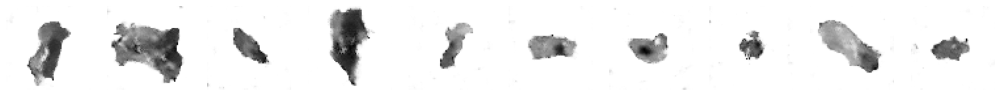

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0440 - d_real_acc: 0.8777 - d_fake_acc: 0.9299 - d_acc: 0.9038 - g_loss: 3.2853 - g_acc: 0.0701
Epoch 35/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0447 - d_real_acc: 0.8736 - d_fake_acc: 0.9288 - d_acc: 0.9012 - g_loss: 3.3782 - g_acc: 0.0712
Saved to ./output/generated_img_034.png


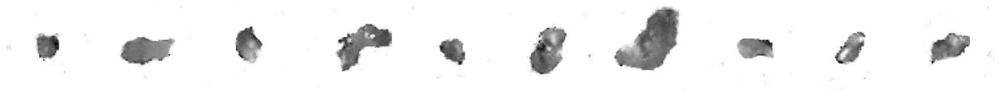

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0447 - d_real_acc: 0.8736 - d_fake_acc: 0.9288 - d_acc: 0.9012 - g_loss: 3.3782 - g_acc: 0.0712
Epoch 36/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0096 - d_real_acc: 0.8841 - d_fake_acc: 0.9358 - d_acc: 0.9099 - g_loss: 3.4633 - g_acc: 0.0642
Saved to ./output/generated_img_035.png


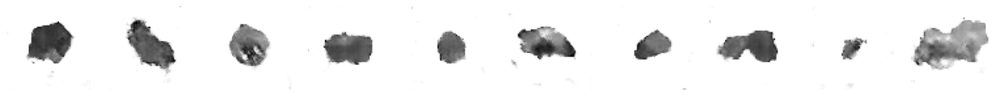

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0096 - d_real_acc: 0.8841 - d_fake_acc: 0.9358 - d_acc: 0.9099 - g_loss: 3.4633 - g_acc: 0.0642
Epoch 37/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0526 - d_real_acc: 0.8725 - d_fake_acc: 0.9202 - d_acc: 0.8964 - g_loss: 3.5485 - g_acc: 0.0798
Saved to ./output/generated_img_036.png


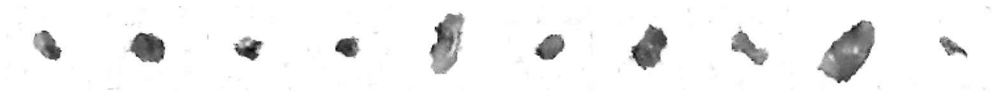

313/313 [==============================] - 30s 96ms/step - d_loss: 0.0526 - d_real_acc: 0.8725 - d_fake_acc: 0.9202 - d_acc: 0.8964 - g_loss: 3.5485 - g_acc: 0.0798
Epoch 38/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.0123 - d_real_acc: 0.8835 - d_fake_acc: 0.9334 - d_acc: 0.9084 - g_loss: 3.5697 - g_acc: 0.0666
Saved to ./output/generated_img_037.png


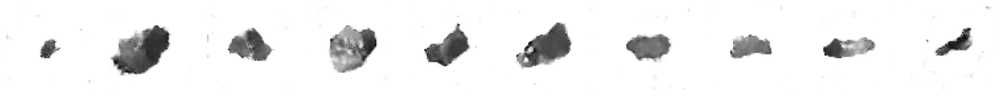

313/313 [==============================] - 30s 95ms/step - d_loss: 0.0119 - d_real_acc: 0.8836 - d_fake_acc: 0.9334 - d_acc: 0.9085 - g_loss: 3.5652 - g_acc: 0.0666
Epoch 39/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.0170 - d_real_acc: 0.8818 - d_fake_acc: 0.9332 - d_acc: 0.9075 - g_loss: 3.5504 - g_acc: 0.0668
Saved to ./output/generated_img_038.png


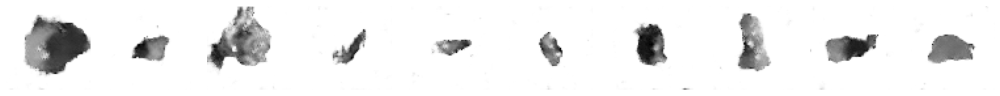

313/313 [==============================] - 29s 93ms/step - d_loss: 0.0167 - d_real_acc: 0.8818 - d_fake_acc: 0.9333 - d_acc: 0.9075 - g_loss: 3.5484 - g_acc: 0.0667
Epoch 40/300
312/313 [============================>.] - ETA: 0s - d_loss: -0.0283 - d_real_acc: 0.8917 - d_fake_acc: 0.9395 - d_acc: 0.9156 - g_loss: 3.7869 - g_acc: 0.0605
Saved to ./output/generated_img_039.png


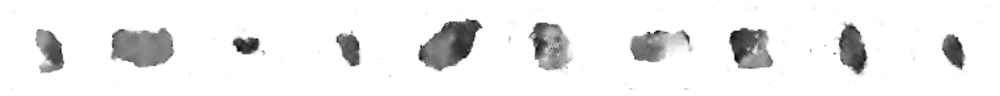

313/313 [==============================] - 29s 92ms/step - d_loss: -0.0285 - d_real_acc: 0.8918 - d_fake_acc: 0.9392 - d_acc: 0.9155 - g_loss: 3.7812 - g_acc: 0.0608
Epoch 41/300
312/313 [============================>.] - ETA: 0s - d_loss: 0.0110 - d_real_acc: 0.8808 - d_fake_acc: 0.9235 - d_acc: 0.9022 - g_loss: 3.8489 - g_acc: 0.0765
Saved to ./output/generated_img_040.png


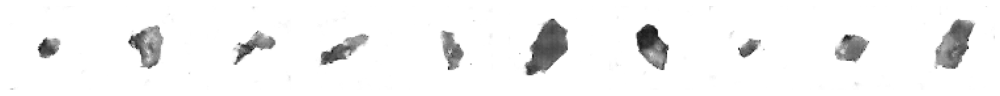

313/313 [==============================] - 29s 93ms/step - d_loss: 0.0107 - d_real_acc: 0.8809 - d_fake_acc: 0.9236 - d_acc: 0.9023 - g_loss: 3.8469 - g_acc: 0.0764
Epoch 42/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0553 - d_real_acc: 0.8973 - d_fake_acc: 0.9421 - d_acc: 0.9197 - g_loss: 3.9379 - g_acc: 0.0579
Saved to ./output/generated_img_041.png


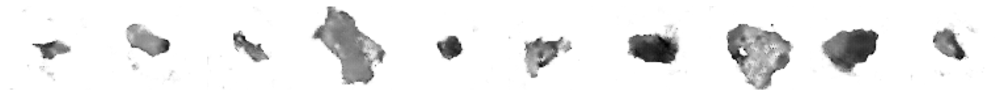

313/313 [==============================] - 29s 93ms/step - d_loss: -0.0553 - d_real_acc: 0.8973 - d_fake_acc: 0.9421 - d_acc: 0.9197 - g_loss: 3.9379 - g_acc: 0.0579
Epoch 43/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0152 - d_real_acc: 0.8813 - d_fake_acc: 0.9284 - d_acc: 0.9049 - g_loss: 3.8447 - g_acc: 0.0716
Saved to ./output/generated_img_042.png


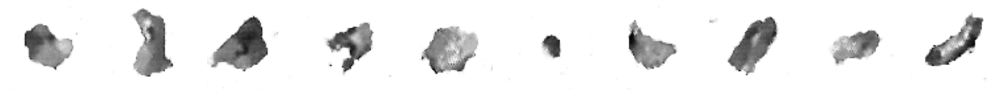

313/313 [==============================] - 29s 93ms/step - d_loss: 0.0152 - d_real_acc: 0.8813 - d_fake_acc: 0.9284 - d_acc: 0.9049 - g_loss: 3.8447 - g_acc: 0.0716
Epoch 44/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0407 - d_real_acc: 0.8934 - d_fake_acc: 0.9373 - d_acc: 0.9153 - g_loss: 4.1549 - g_acc: 0.0627
Saved to ./output/generated_img_043.png


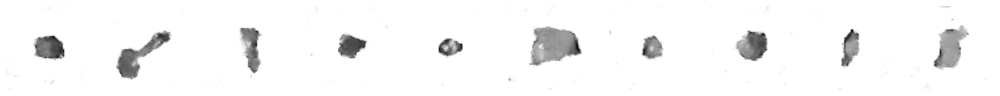

313/313 [==============================] - 29s 93ms/step - d_loss: -0.0407 - d_real_acc: 0.8934 - d_fake_acc: 0.9373 - d_acc: 0.9153 - g_loss: 4.1549 - g_acc: 0.0627
Epoch 45/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0108 - d_real_acc: 0.8871 - d_fake_acc: 0.9293 - d_acc: 0.9082 - g_loss: 3.9829 - g_acc: 0.0707
Saved to ./output/generated_img_044.png


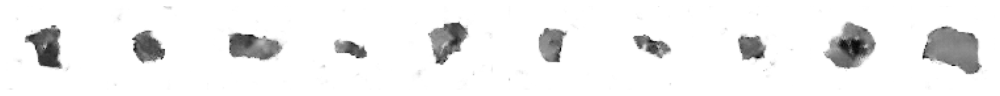

313/313 [==============================] - 30s 94ms/step - d_loss: -0.0108 - d_real_acc: 0.8871 - d_fake_acc: 0.9293 - d_acc: 0.9082 - g_loss: 3.9829 - g_acc: 0.0707
Epoch 46/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0815 - d_real_acc: 0.9043 - d_fake_acc: 0.9527 - d_acc: 0.9285 - g_loss: 4.0820 - g_acc: 0.0473
Saved to ./output/generated_img_045.png


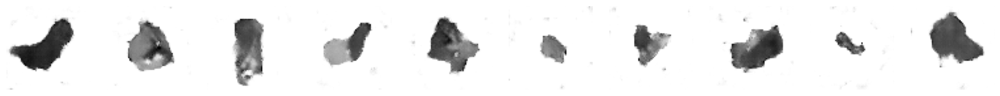

313/313 [==============================] - 30s 95ms/step - d_loss: -0.0815 - d_real_acc: 0.9043 - d_fake_acc: 0.9527 - d_acc: 0.9285 - g_loss: 4.0820 - g_acc: 0.0473
Epoch 47/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0440 - d_real_acc: 0.8943 - d_fake_acc: 0.9383 - d_acc: 0.9163 - g_loss: 4.2616 - g_acc: 0.0617
Saved to ./output/generated_img_046.png


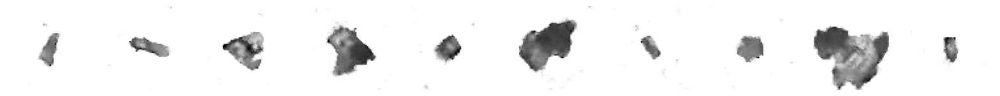

313/313 [==============================] - 30s 95ms/step - d_loss: -0.0440 - d_real_acc: 0.8943 - d_fake_acc: 0.9383 - d_acc: 0.9163 - g_loss: 4.2616 - g_acc: 0.0617
Epoch 48/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0575 - d_real_acc: 0.8960 - d_fake_acc: 0.9380 - d_acc: 0.9170 - g_loss: 4.3120 - g_acc: 0.0620
Saved to ./output/generated_img_047.png


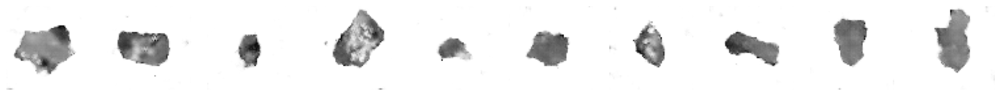

313/313 [==============================] - 30s 95ms/step - d_loss: -0.0575 - d_real_acc: 0.8960 - d_fake_acc: 0.9380 - d_acc: 0.9170 - g_loss: 4.3120 - g_acc: 0.0620
Epoch 49/300
312/313 [============================>.] - ETA: 0s - d_loss: -0.0926 - d_real_acc: 0.9047 - d_fake_acc: 0.9471 - d_acc: 0.9259 - g_loss: 4.4152 - g_acc: 0.0529
Saved to ./output/generated_img_048.png


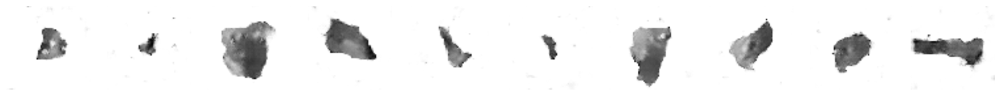

313/313 [==============================] - 30s 94ms/step - d_loss: -0.0931 - d_real_acc: 0.9049 - d_fake_acc: 0.9471 - d_acc: 0.9260 - g_loss: 4.4131 - g_acc: 0.0529
Epoch 50/300
313/313 [==============================] - ETA: 0s - d_loss: 0.0101 - d_real_acc: 0.8830 - d_fake_acc: 0.9259 - d_acc: 0.9044 - g_loss: 4.1746 - g_acc: 0.0741
Saved to ./output/generated_img_049.png


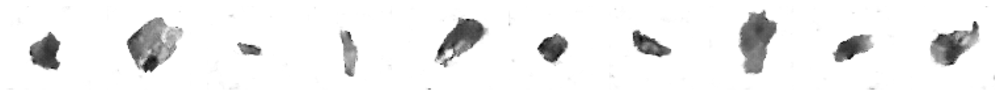

313/313 [==============================] - 32s 100ms/step - d_loss: 0.0101 - d_real_acc: 0.8830 - d_fake_acc: 0.9259 - d_acc: 0.9044 - g_loss: 4.1746 - g_acc: 0.0741
Epoch 51/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0840 - d_real_acc: 0.9011 - d_fake_acc: 0.9456 - d_acc: 0.9234 - g_loss: 4.3782 - g_acc: 0.0544
Saved to ./output/generated_img_050.png


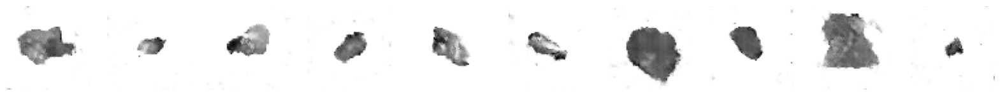

313/313 [==============================] - 32s 102ms/step - d_loss: -0.0840 - d_real_acc: 0.9011 - d_fake_acc: 0.9456 - d_acc: 0.9234 - g_loss: 4.3782 - g_acc: 0.0544
Epoch 52/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0665 - d_real_acc: 0.8980 - d_fake_acc: 0.9416 - d_acc: 0.9198 - g_loss: 4.4822 - g_acc: 0.0584
Saved to ./output/generated_img_051.png


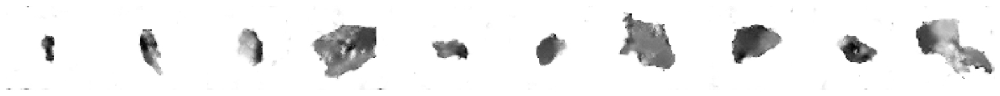

313/313 [==============================] - 32s 102ms/step - d_loss: -0.0665 - d_real_acc: 0.8980 - d_fake_acc: 0.9416 - d_acc: 0.9198 - g_loss: 4.4822 - g_acc: 0.0584
Epoch 53/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0584 - d_real_acc: 0.8951 - d_fake_acc: 0.9370 - d_acc: 0.9161 - g_loss: 4.4851 - g_acc: 0.0630
Saved to ./output/generated_img_052.png


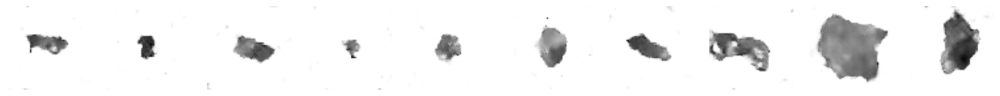

313/313 [==============================] - 32s 102ms/step - d_loss: -0.0584 - d_real_acc: 0.8951 - d_fake_acc: 0.9370 - d_acc: 0.9161 - g_loss: 4.4851 - g_acc: 0.0630
Epoch 54/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0701 - d_real_acc: 0.8977 - d_fake_acc: 0.9395 - d_acc: 0.9186 - g_loss: 4.5667 - g_acc: 0.0605
Saved to ./output/generated_img_053.png


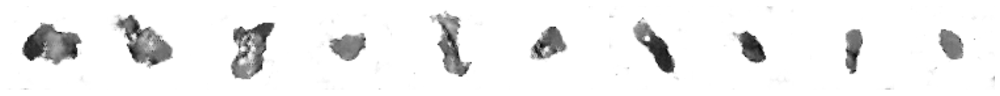

313/313 [==============================] - 32s 100ms/step - d_loss: -0.0701 - d_real_acc: 0.8977 - d_fake_acc: 0.9395 - d_acc: 0.9186 - g_loss: 4.5667 - g_acc: 0.0605
Epoch 55/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0825 - d_real_acc: 0.9014 - d_fake_acc: 0.9417 - d_acc: 0.9216 - g_loss: 4.4560 - g_acc: 0.0582
Saved to ./output/generated_img_054.png


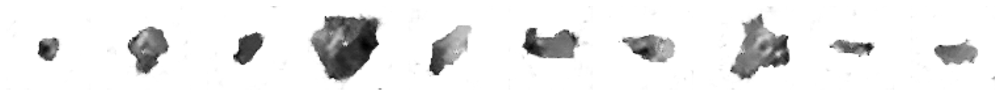

313/313 [==============================] - 31s 100ms/step - d_loss: -0.0825 - d_real_acc: 0.9014 - d_fake_acc: 0.9417 - d_acc: 0.9216 - g_loss: 4.4560 - g_acc: 0.0582
Epoch 56/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0680 - d_real_acc: 0.8963 - d_fake_acc: 0.9333 - d_acc: 0.9147 - g_loss: 4.7411 - g_acc: 0.0667
Saved to ./output/generated_img_055.png


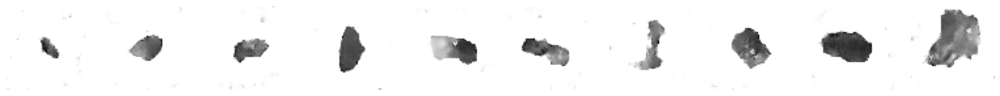

313/313 [==============================] - 31s 99ms/step - d_loss: -0.0680 - d_real_acc: 0.8963 - d_fake_acc: 0.9333 - d_acc: 0.9147 - g_loss: 4.7411 - g_acc: 0.0667
Epoch 57/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1244 - d_real_acc: 0.9075 - d_fake_acc: 0.9506 - d_acc: 0.9291 - g_loss: 4.7857 - g_acc: 0.0494
Saved to ./output/generated_img_056.png


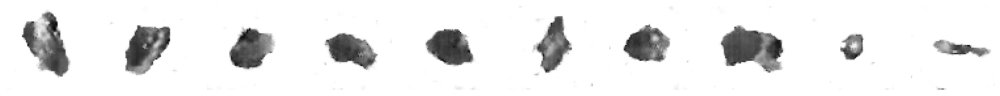

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1244 - d_real_acc: 0.9075 - d_fake_acc: 0.9506 - d_acc: 0.9291 - g_loss: 4.7857 - g_acc: 0.0494
Epoch 58/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0868 - d_real_acc: 0.9003 - d_fake_acc: 0.9376 - d_acc: 0.9190 - g_loss: 4.7813 - g_acc: 0.0624
Saved to ./output/generated_img_057.png


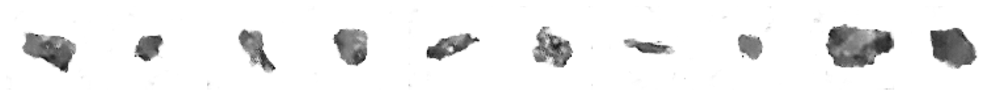

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0868 - d_real_acc: 0.9003 - d_fake_acc: 0.9376 - d_acc: 0.9190 - g_loss: 4.7813 - g_acc: 0.0624
Epoch 59/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0972 - d_real_acc: 0.9056 - d_fake_acc: 0.9470 - d_acc: 0.9263 - g_loss: 4.6548 - g_acc: 0.0531
Saved to ./output/generated_img_058.png


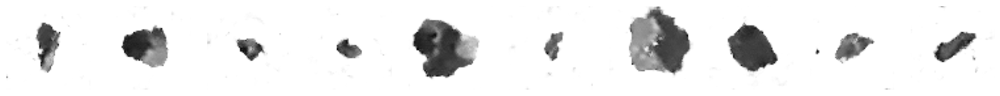

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0972 - d_real_acc: 0.9056 - d_fake_acc: 0.9470 - d_acc: 0.9263 - g_loss: 4.6548 - g_acc: 0.0531
Epoch 60/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0952 - d_real_acc: 0.9020 - d_fake_acc: 0.9446 - d_acc: 0.9233 - g_loss: 4.7438 - g_acc: 0.0553
Saved to ./output/generated_img_059.png


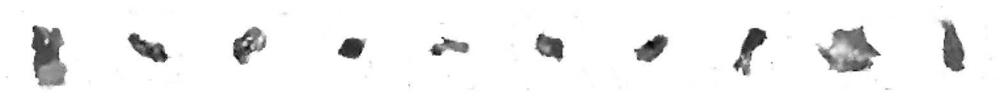

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0952 - d_real_acc: 0.9020 - d_fake_acc: 0.9446 - d_acc: 0.9233 - g_loss: 4.7438 - g_acc: 0.0553
Epoch 61/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1108 - d_real_acc: 0.9085 - d_fake_acc: 0.9492 - d_acc: 0.9288 - g_loss: 4.7881 - g_acc: 0.0509
Saved to ./output/generated_img_060.png


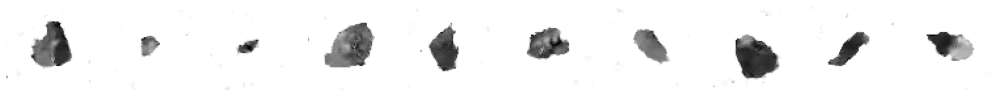

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1108 - d_real_acc: 0.9085 - d_fake_acc: 0.9492 - d_acc: 0.9288 - g_loss: 4.7881 - g_acc: 0.0509
Epoch 62/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0962 - d_real_acc: 0.9031 - d_fake_acc: 0.9403 - d_acc: 0.9217 - g_loss: 4.8830 - g_acc: 0.0597
Saved to ./output/generated_img_061.png


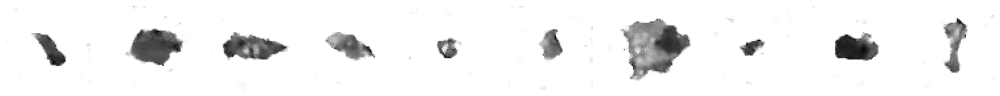

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0962 - d_real_acc: 0.9031 - d_fake_acc: 0.9403 - d_acc: 0.9217 - g_loss: 4.8830 - g_acc: 0.0597
Epoch 63/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1448 - d_real_acc: 0.9141 - d_fake_acc: 0.9528 - d_acc: 0.9335 - g_loss: 5.0841 - g_acc: 0.0472
Saved to ./output/generated_img_062.png


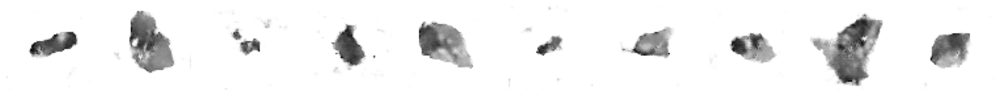

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1448 - d_real_acc: 0.9141 - d_fake_acc: 0.9528 - d_acc: 0.9335 - g_loss: 5.0841 - g_acc: 0.0472
Epoch 64/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0792 - d_real_acc: 0.8997 - d_fake_acc: 0.9414 - d_acc: 0.9205 - g_loss: 4.6570 - g_acc: 0.0586
Saved to ./output/generated_img_063.png


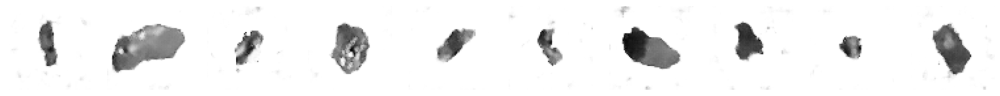

313/313 [==============================] - 31s 97ms/step - d_loss: -0.0792 - d_real_acc: 0.8997 - d_fake_acc: 0.9414 - d_acc: 0.9205 - g_loss: 4.6570 - g_acc: 0.0586
Epoch 65/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1119 - d_real_acc: 0.9070 - d_fake_acc: 0.9444 - d_acc: 0.9257 - g_loss: 4.9931 - g_acc: 0.0556
Saved to ./output/generated_img_064.png


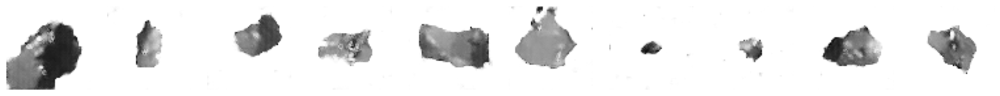

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1119 - d_real_acc: 0.9070 - d_fake_acc: 0.9444 - d_acc: 0.9257 - g_loss: 4.9931 - g_acc: 0.0556
Epoch 66/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1105 - d_real_acc: 0.9058 - d_fake_acc: 0.9458 - d_acc: 0.9258 - g_loss: 5.0225 - g_acc: 0.0542
Saved to ./output/generated_img_065.png


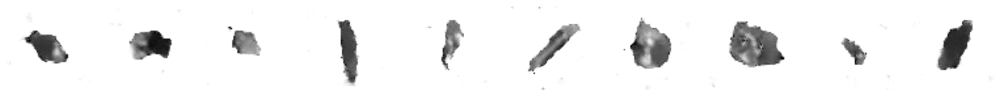

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1105 - d_real_acc: 0.9058 - d_fake_acc: 0.9458 - d_acc: 0.9258 - g_loss: 5.0225 - g_acc: 0.0542
Epoch 67/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1108 - d_real_acc: 0.9059 - d_fake_acc: 0.9425 - d_acc: 0.9242 - g_loss: 5.2601 - g_acc: 0.0575
Saved to ./output/generated_img_066.png


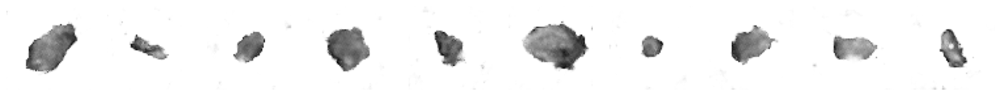

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1108 - d_real_acc: 0.9059 - d_fake_acc: 0.9425 - d_acc: 0.9242 - g_loss: 5.2601 - g_acc: 0.0575
Epoch 68/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1339 - d_real_acc: 0.9112 - d_fake_acc: 0.9531 - d_acc: 0.9322 - g_loss: 4.9012 - g_acc: 0.0468
Saved to ./output/generated_img_067.png


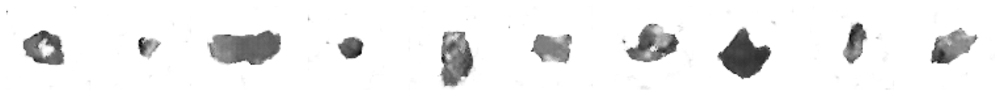

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1339 - d_real_acc: 0.9112 - d_fake_acc: 0.9531 - d_acc: 0.9322 - g_loss: 4.9012 - g_acc: 0.0468
Epoch 69/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1431 - d_real_acc: 0.9123 - d_fake_acc: 0.9509 - d_acc: 0.9316 - g_loss: 5.1973 - g_acc: 0.0491
Saved to ./output/generated_img_068.png


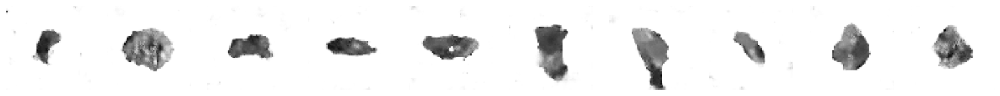

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1431 - d_real_acc: 0.9123 - d_fake_acc: 0.9509 - d_acc: 0.9316 - g_loss: 5.1973 - g_acc: 0.0491
Epoch 70/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1636 - d_real_acc: 0.9157 - d_fake_acc: 0.9530 - d_acc: 0.9343 - g_loss: 5.2887 - g_acc: 0.0470
Saved to ./output/generated_img_069.png


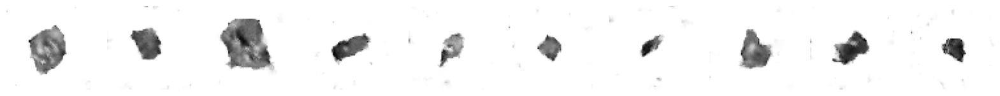

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1636 - d_real_acc: 0.9157 - d_fake_acc: 0.9530 - d_acc: 0.9343 - g_loss: 5.2887 - g_acc: 0.0470
Epoch 71/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1634 - d_real_acc: 0.9130 - d_fake_acc: 0.9487 - d_acc: 0.9309 - g_loss: 5.5708 - g_acc: 0.0513
Saved to ./output/generated_img_070.png


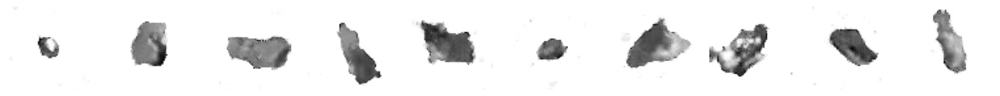

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1634 - d_real_acc: 0.9130 - d_fake_acc: 0.9487 - d_acc: 0.9309 - g_loss: 5.5708 - g_acc: 0.0513
Epoch 72/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0746 - d_real_acc: 0.9025 - d_fake_acc: 0.9416 - d_acc: 0.9221 - g_loss: 5.1401 - g_acc: 0.0584
Saved to ./output/generated_img_071.png


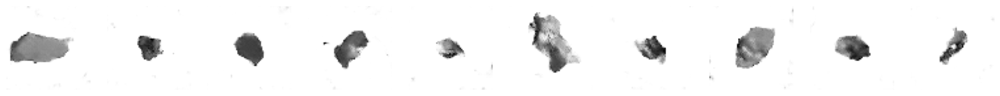

313/313 [==============================] - 31s 97ms/step - d_loss: -0.0746 - d_real_acc: 0.9025 - d_fake_acc: 0.9416 - d_acc: 0.9221 - g_loss: 5.1401 - g_acc: 0.0584
Epoch 73/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1705 - d_real_acc: 0.9162 - d_fake_acc: 0.9534 - d_acc: 0.9348 - g_loss: 5.4139 - g_acc: 0.0466
Saved to ./output/generated_img_072.png


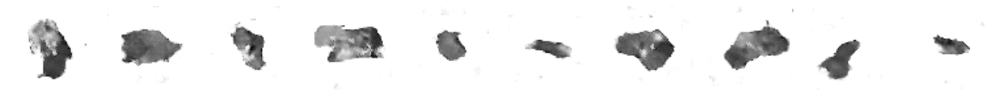

313/313 [==============================] - 31s 97ms/step - d_loss: -0.1705 - d_real_acc: 0.9162 - d_fake_acc: 0.9534 - d_acc: 0.9348 - g_loss: 5.4139 - g_acc: 0.0466
Epoch 74/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1619 - d_real_acc: 0.9153 - d_fake_acc: 0.9517 - d_acc: 0.9335 - g_loss: 5.4893 - g_acc: 0.0483
Saved to ./output/generated_img_073.png


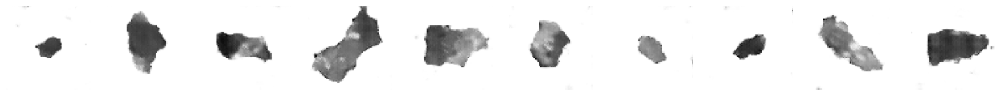

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1619 - d_real_acc: 0.9153 - d_fake_acc: 0.9517 - d_acc: 0.9335 - g_loss: 5.4893 - g_acc: 0.0483
Epoch 75/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1821 - d_real_acc: 0.9190 - d_fake_acc: 0.9561 - d_acc: 0.9376 - g_loss: 5.4647 - g_acc: 0.0439
Saved to ./output/generated_img_074.png


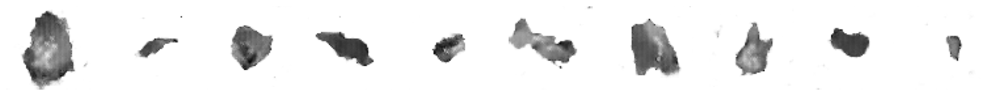

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1821 - d_real_acc: 0.9190 - d_fake_acc: 0.9561 - d_acc: 0.9376 - g_loss: 5.4647 - g_acc: 0.0439
Epoch 76/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1134 - d_real_acc: 0.9049 - d_fake_acc: 0.9432 - d_acc: 0.9241 - g_loss: 5.3338 - g_acc: 0.0568
Saved to ./output/generated_img_075.png


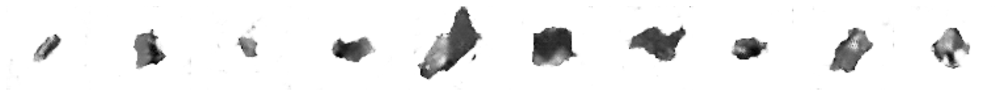

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1134 - d_real_acc: 0.9049 - d_fake_acc: 0.9432 - d_acc: 0.9241 - g_loss: 5.3338 - g_acc: 0.0568
Epoch 77/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1643 - d_real_acc: 0.9136 - d_fake_acc: 0.9495 - d_acc: 0.9316 - g_loss: 5.4972 - g_acc: 0.0505
Saved to ./output/generated_img_076.png


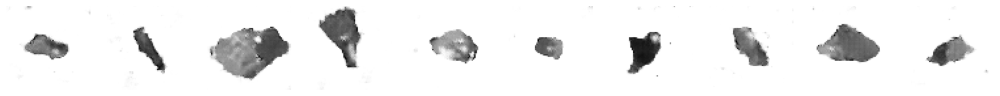

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1643 - d_real_acc: 0.9136 - d_fake_acc: 0.9495 - d_acc: 0.9316 - g_loss: 5.4972 - g_acc: 0.0505
Epoch 78/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1708 - d_real_acc: 0.9160 - d_fake_acc: 0.9556 - d_acc: 0.9358 - g_loss: 5.4845 - g_acc: 0.0444
Saved to ./output/generated_img_077.png


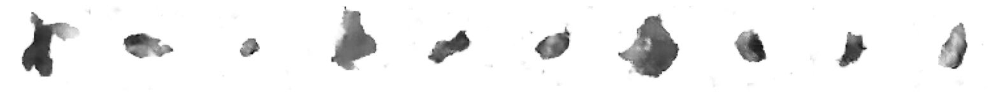

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1708 - d_real_acc: 0.9160 - d_fake_acc: 0.9556 - d_acc: 0.9358 - g_loss: 5.4845 - g_acc: 0.0444
Epoch 79/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1732 - d_real_acc: 0.9170 - d_fake_acc: 0.9524 - d_acc: 0.9347 - g_loss: 5.6348 - g_acc: 0.0476
Saved to ./output/generated_img_078.png


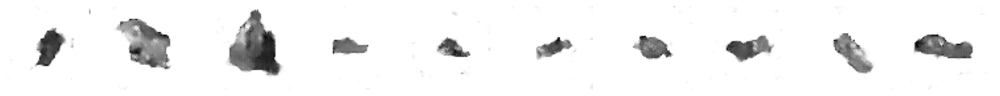

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1732 - d_real_acc: 0.9170 - d_fake_acc: 0.9524 - d_acc: 0.9347 - g_loss: 5.6348 - g_acc: 0.0476
Epoch 80/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1569 - d_real_acc: 0.9122 - d_fake_acc: 0.9484 - d_acc: 0.9303 - g_loss: 5.5972 - g_acc: 0.0516
Saved to ./output/generated_img_079.png


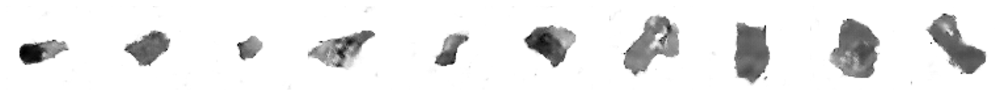

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1569 - d_real_acc: 0.9122 - d_fake_acc: 0.9484 - d_acc: 0.9303 - g_loss: 5.5972 - g_acc: 0.0516
Epoch 81/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0628 - d_real_acc: 0.8982 - d_fake_acc: 0.9365 - d_acc: 0.9174 - g_loss: 5.2091 - g_acc: 0.0635
Saved to ./output/generated_img_080.png


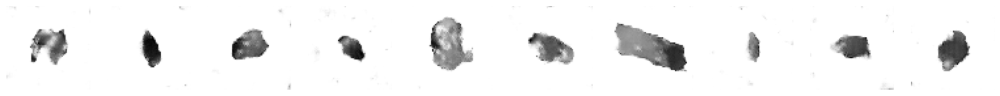

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0628 - d_real_acc: 0.8982 - d_fake_acc: 0.9365 - d_acc: 0.9174 - g_loss: 5.2091 - g_acc: 0.0635
Epoch 82/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2172 - d_real_acc: 0.9240 - d_fake_acc: 0.9592 - d_acc: 0.9416 - g_loss: 5.7647 - g_acc: 0.0408
Saved to ./output/generated_img_081.png


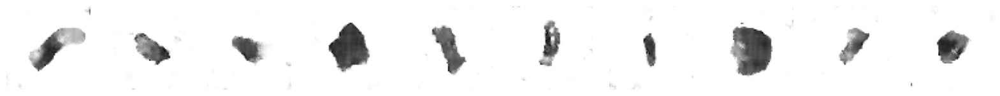

313/313 [==============================] - 31s 99ms/step - d_loss: -0.2172 - d_real_acc: 0.9240 - d_fake_acc: 0.9592 - d_acc: 0.9416 - g_loss: 5.7647 - g_acc: 0.0408
Epoch 83/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1320 - d_real_acc: 0.9069 - d_fake_acc: 0.9444 - d_acc: 0.9257 - g_loss: 5.5764 - g_acc: 0.0556
Saved to ./output/generated_img_082.png


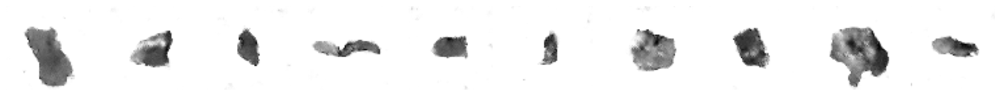

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1320 - d_real_acc: 0.9069 - d_fake_acc: 0.9444 - d_acc: 0.9257 - g_loss: 5.5764 - g_acc: 0.0556
Epoch 84/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1765 - d_real_acc: 0.9189 - d_fake_acc: 0.9550 - d_acc: 0.9370 - g_loss: 5.6333 - g_acc: 0.0450
Saved to ./output/generated_img_083.png


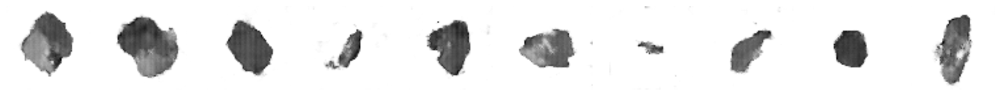

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1765 - d_real_acc: 0.9189 - d_fake_acc: 0.9550 - d_acc: 0.9370 - g_loss: 5.6333 - g_acc: 0.0450
Epoch 85/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2550 - d_real_acc: 0.9320 - d_fake_acc: 0.9697 - d_acc: 0.9509 - g_loss: 5.8458 - g_acc: 0.0303
Saved to ./output/generated_img_084.png


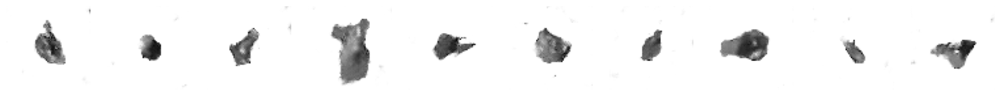

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2550 - d_real_acc: 0.9320 - d_fake_acc: 0.9697 - d_acc: 0.9509 - g_loss: 5.8458 - g_acc: 0.0303
Epoch 86/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2229 - d_real_acc: 0.9230 - d_fake_acc: 0.9561 - d_acc: 0.9395 - g_loss: 6.3001 - g_acc: 0.0439
Saved to ./output/generated_img_085.png


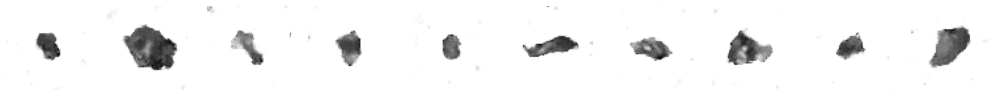

313/313 [==============================] - 31s 99ms/step - d_loss: -0.2229 - d_real_acc: 0.9230 - d_fake_acc: 0.9561 - d_acc: 0.9395 - g_loss: 6.3001 - g_acc: 0.0439
Epoch 87/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1517 - d_real_acc: 0.9100 - d_fake_acc: 0.9415 - d_acc: 0.9257 - g_loss: 6.2015 - g_acc: 0.0585
Saved to ./output/generated_img_086.png


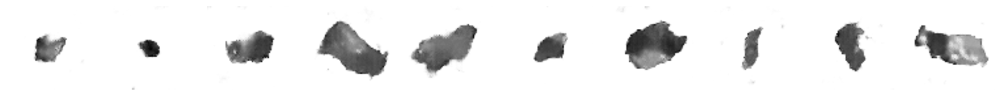

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1517 - d_real_acc: 0.9100 - d_fake_acc: 0.9415 - d_acc: 0.9257 - g_loss: 6.2015 - g_acc: 0.0585
Epoch 88/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1620 - d_real_acc: 0.9157 - d_fake_acc: 0.9538 - d_acc: 0.9348 - g_loss: 5.5604 - g_acc: 0.0462
Saved to ./output/generated_img_087.png


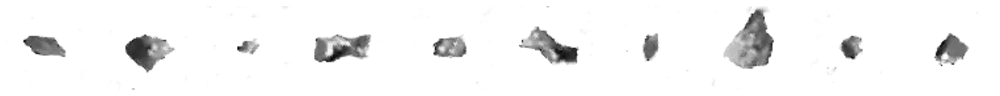

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1620 - d_real_acc: 0.9157 - d_fake_acc: 0.9538 - d_acc: 0.9348 - g_loss: 5.5604 - g_acc: 0.0462
Epoch 89/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2151 - d_real_acc: 0.9224 - d_fake_acc: 0.9570 - d_acc: 0.9397 - g_loss: 6.1145 - g_acc: 0.0430
Saved to ./output/generated_img_088.png


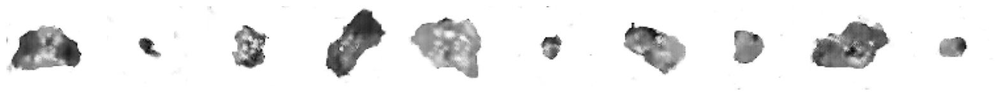

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2151 - d_real_acc: 0.9224 - d_fake_acc: 0.9570 - d_acc: 0.9397 - g_loss: 6.1145 - g_acc: 0.0430
Epoch 90/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1739 - d_real_acc: 0.9153 - d_fake_acc: 0.9476 - d_acc: 0.9314 - g_loss: 6.1700 - g_acc: 0.0524
Saved to ./output/generated_img_089.png


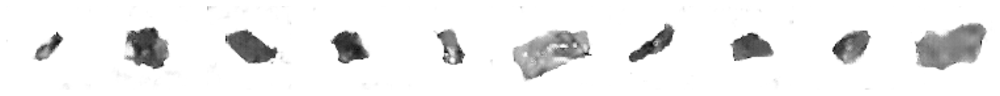

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1739 - d_real_acc: 0.9153 - d_fake_acc: 0.9476 - d_acc: 0.9314 - g_loss: 6.1700 - g_acc: 0.0524
Epoch 91/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2619 - d_real_acc: 0.9344 - d_fake_acc: 0.9702 - d_acc: 0.9523 - g_loss: 6.0498 - g_acc: 0.0298
Saved to ./output/generated_img_090.png


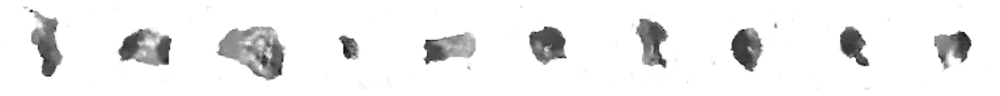

313/313 [==============================] - 31s 99ms/step - d_loss: -0.2619 - d_real_acc: 0.9344 - d_fake_acc: 0.9702 - d_acc: 0.9523 - g_loss: 6.0498 - g_acc: 0.0298
Epoch 92/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1900 - d_real_acc: 0.9165 - d_fake_acc: 0.9494 - d_acc: 0.9330 - g_loss: 6.3544 - g_acc: 0.0506
Saved to ./output/generated_img_091.png


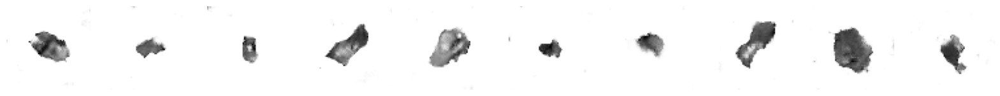

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1900 - d_real_acc: 0.9165 - d_fake_acc: 0.9494 - d_acc: 0.9330 - g_loss: 6.3544 - g_acc: 0.0506
Epoch 93/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1495 - d_real_acc: 0.9115 - d_fake_acc: 0.9444 - d_acc: 0.9279 - g_loss: 6.2517 - g_acc: 0.0556
Saved to ./output/generated_img_092.png


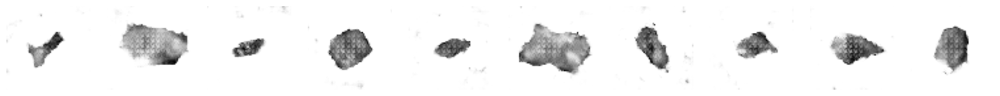

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1495 - d_real_acc: 0.9115 - d_fake_acc: 0.9444 - d_acc: 0.9279 - g_loss: 6.2517 - g_acc: 0.0556
Epoch 94/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2527 - d_real_acc: 0.9344 - d_fake_acc: 0.9728 - d_acc: 0.9536 - g_loss: 5.7345 - g_acc: 0.0272
Saved to ./output/generated_img_093.png


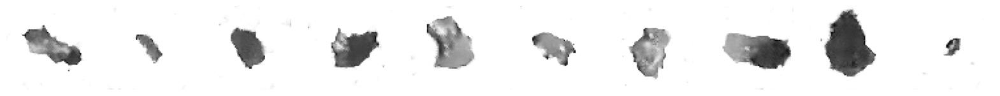

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2527 - d_real_acc: 0.9344 - d_fake_acc: 0.9728 - d_acc: 0.9536 - g_loss: 5.7345 - g_acc: 0.0272
Epoch 95/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1764 - d_real_acc: 0.9167 - d_fake_acc: 0.9518 - d_acc: 0.9343 - g_loss: 6.1382 - g_acc: 0.0481
Saved to ./output/generated_img_094.png


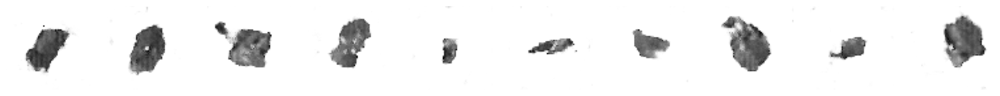

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1764 - d_real_acc: 0.9167 - d_fake_acc: 0.9518 - d_acc: 0.9343 - g_loss: 6.1382 - g_acc: 0.0481
Epoch 96/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1447 - d_real_acc: 0.9110 - d_fake_acc: 0.9442 - d_acc: 0.9276 - g_loss: 6.0256 - g_acc: 0.0558
Saved to ./output/generated_img_095.png


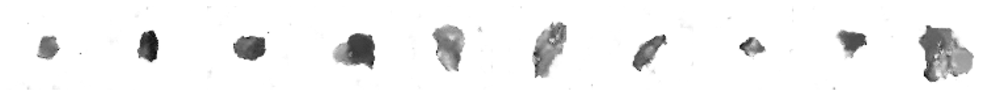

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1447 - d_real_acc: 0.9110 - d_fake_acc: 0.9442 - d_acc: 0.9276 - g_loss: 6.0256 - g_acc: 0.0558
Epoch 97/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2285 - d_real_acc: 0.9248 - d_fake_acc: 0.9582 - d_acc: 0.9415 - g_loss: 6.1884 - g_acc: 0.0419
Saved to ./output/generated_img_096.png


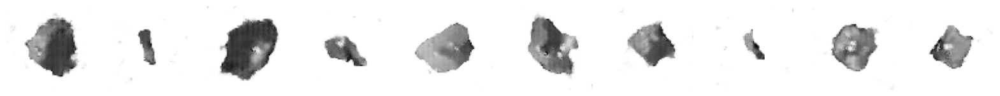

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2285 - d_real_acc: 0.9248 - d_fake_acc: 0.9582 - d_acc: 0.9415 - g_loss: 6.1884 - g_acc: 0.0419
Epoch 98/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2150 - d_real_acc: 0.9223 - d_fake_acc: 0.9588 - d_acc: 0.9406 - g_loss: 6.1936 - g_acc: 0.0412
Saved to ./output/generated_img_097.png


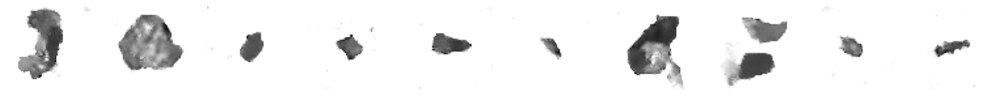

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2150 - d_real_acc: 0.9223 - d_fake_acc: 0.9588 - d_acc: 0.9406 - g_loss: 6.1936 - g_acc: 0.0412
Epoch 99/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2355 - d_real_acc: 0.9233 - d_fake_acc: 0.9541 - d_acc: 0.9387 - g_loss: 6.7862 - g_acc: 0.0459
Saved to ./output/generated_img_098.png


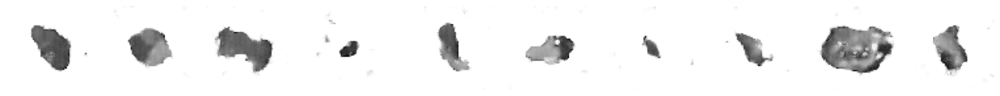

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2355 - d_real_acc: 0.9233 - d_fake_acc: 0.9541 - d_acc: 0.9387 - g_loss: 6.7862 - g_acc: 0.0459
Epoch 100/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2724 - d_real_acc: 0.9333 - d_fake_acc: 0.9694 - d_acc: 0.9513 - g_loss: 6.1493 - g_acc: 0.0306
Saved to ./output/generated_img_099.png


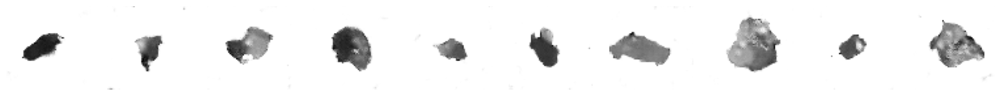

313/313 [==============================] - 31s 99ms/step - d_loss: -0.2724 - d_real_acc: 0.9333 - d_fake_acc: 0.9694 - d_acc: 0.9513 - g_loss: 6.1493 - g_acc: 0.0306
Epoch 101/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1639 - d_real_acc: 0.9131 - d_fake_acc: 0.9449 - d_acc: 0.9290 - g_loss: 6.5271 - g_acc: 0.0551
Saved to ./output/generated_img_100.png


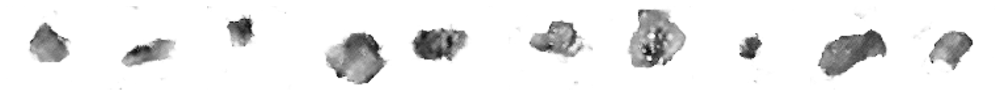

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1639 - d_real_acc: 0.9131 - d_fake_acc: 0.9449 - d_acc: 0.9290 - g_loss: 6.5271 - g_acc: 0.0551
Epoch 102/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2694 - d_real_acc: 0.9311 - d_fake_acc: 0.9650 - d_acc: 0.9481 - g_loss: 6.3625 - g_acc: 0.0350
Saved to ./output/generated_img_101.png


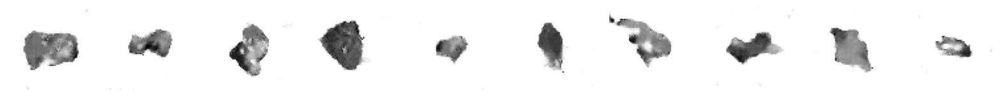

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2694 - d_real_acc: 0.9311 - d_fake_acc: 0.9650 - d_acc: 0.9481 - g_loss: 6.3625 - g_acc: 0.0350
Epoch 103/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2496 - d_real_acc: 0.9259 - d_fake_acc: 0.9589 - d_acc: 0.9424 - g_loss: 6.6693 - g_acc: 0.0411
Saved to ./output/generated_img_102.png


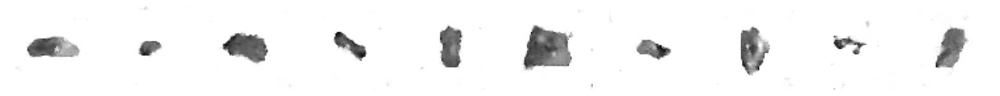

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2496 - d_real_acc: 0.9259 - d_fake_acc: 0.9589 - d_acc: 0.9424 - g_loss: 6.6693 - g_acc: 0.0411
Epoch 104/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2239 - d_real_acc: 0.9241 - d_fake_acc: 0.9571 - d_acc: 0.9406 - g_loss: 6.4963 - g_acc: 0.0429
Saved to ./output/generated_img_103.png


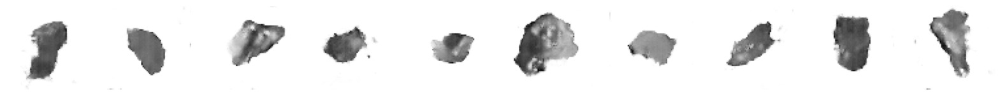

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2239 - d_real_acc: 0.9241 - d_fake_acc: 0.9571 - d_acc: 0.9406 - g_loss: 6.4963 - g_acc: 0.0429
Epoch 105/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3019 - d_real_acc: 0.9374 - d_fake_acc: 0.9691 - d_acc: 0.9533 - g_loss: 6.7992 - g_acc: 0.0309
Saved to ./output/generated_img_104.png


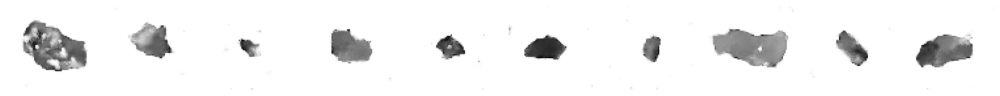

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3019 - d_real_acc: 0.9374 - d_fake_acc: 0.9691 - d_acc: 0.9533 - g_loss: 6.7992 - g_acc: 0.0309
Epoch 106/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1419 - d_real_acc: 0.9123 - d_fake_acc: 0.9475 - d_acc: 0.9299 - g_loss: 6.4176 - g_acc: 0.0525
Saved to ./output/generated_img_105.png


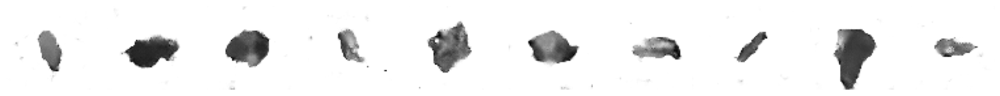

313/313 [==============================] - 31s 99ms/step - d_loss: -0.1419 - d_real_acc: 0.9123 - d_fake_acc: 0.9475 - d_acc: 0.9299 - g_loss: 6.4176 - g_acc: 0.0525
Epoch 107/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1982 - d_real_acc: 0.9193 - d_fake_acc: 0.9549 - d_acc: 0.9371 - g_loss: 6.2114 - g_acc: 0.0450
Saved to ./output/generated_img_106.png


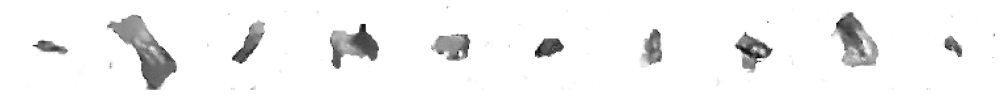

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1982 - d_real_acc: 0.9193 - d_fake_acc: 0.9549 - d_acc: 0.9371 - g_loss: 6.2114 - g_acc: 0.0450
Epoch 108/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2830 - d_real_acc: 0.9305 - d_fake_acc: 0.9621 - d_acc: 0.9463 - g_loss: 6.8047 - g_acc: 0.0378
Saved to ./output/generated_img_107.png


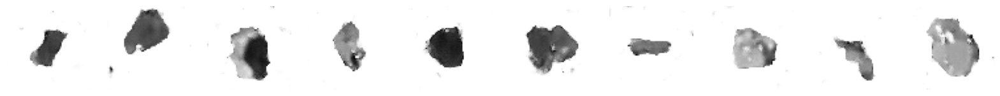

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2830 - d_real_acc: 0.9305 - d_fake_acc: 0.9621 - d_acc: 0.9463 - g_loss: 6.8047 - g_acc: 0.0378
Epoch 109/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2302 - d_real_acc: 0.9241 - d_fake_acc: 0.9595 - d_acc: 0.9418 - g_loss: 6.5736 - g_acc: 0.0405
Saved to ./output/generated_img_108.png


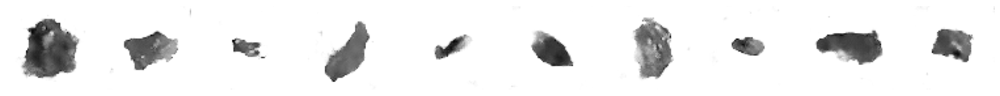

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2302 - d_real_acc: 0.9241 - d_fake_acc: 0.9595 - d_acc: 0.9418 - g_loss: 6.5736 - g_acc: 0.0405
Epoch 110/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2239 - d_real_acc: 0.9227 - d_fake_acc: 0.9549 - d_acc: 0.9388 - g_loss: 6.7062 - g_acc: 0.0450
Saved to ./output/generated_img_109.png


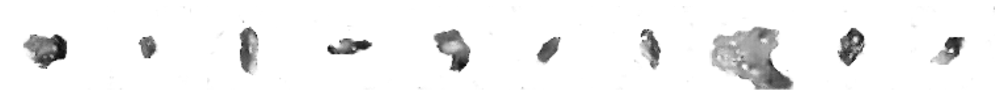

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2239 - d_real_acc: 0.9227 - d_fake_acc: 0.9549 - d_acc: 0.9388 - g_loss: 6.7062 - g_acc: 0.0450
Epoch 111/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2995 - d_real_acc: 0.9375 - d_fake_acc: 0.9682 - d_acc: 0.9529 - g_loss: 6.9301 - g_acc: 0.0318
Saved to ./output/generated_img_110.png


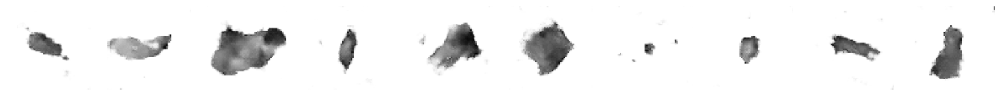

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2995 - d_real_acc: 0.9375 - d_fake_acc: 0.9682 - d_acc: 0.9529 - g_loss: 6.9301 - g_acc: 0.0318
Epoch 112/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2290 - d_real_acc: 0.9275 - d_fake_acc: 0.9623 - d_acc: 0.9449 - g_loss: 6.4113 - g_acc: 0.0377
Saved to ./output/generated_img_111.png


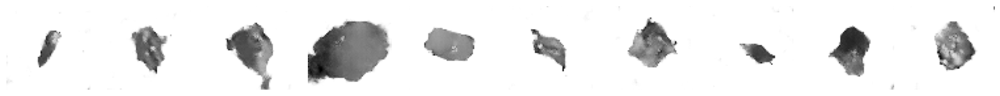

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2290 - d_real_acc: 0.9275 - d_fake_acc: 0.9623 - d_acc: 0.9449 - g_loss: 6.4113 - g_acc: 0.0377
Epoch 113/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2700 - d_real_acc: 0.9290 - d_fake_acc: 0.9609 - d_acc: 0.9449 - g_loss: 7.0022 - g_acc: 0.0391
Saved to ./output/generated_img_112.png


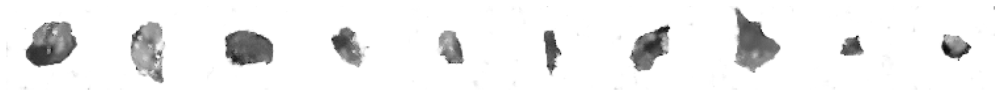

313/313 [==============================] - 30s 97ms/step - d_loss: -0.2700 - d_real_acc: 0.9290 - d_fake_acc: 0.9609 - d_acc: 0.9449 - g_loss: 7.0022 - g_acc: 0.0391
Epoch 114/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2851 - d_real_acc: 0.9321 - d_fake_acc: 0.9612 - d_acc: 0.9466 - g_loss: 7.2005 - g_acc: 0.0388
Saved to ./output/generated_img_113.png


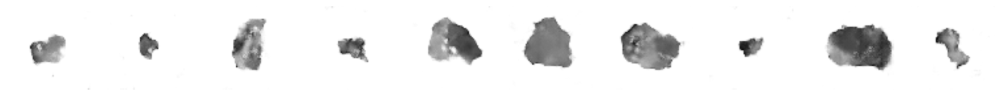

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2851 - d_real_acc: 0.9321 - d_fake_acc: 0.9612 - d_acc: 0.9466 - g_loss: 7.2005 - g_acc: 0.0388
Epoch 115/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1988 - d_real_acc: 0.9148 - d_fake_acc: 0.9468 - d_acc: 0.9308 - g_loss: 7.0193 - g_acc: 0.0532
Saved to ./output/generated_img_114.png


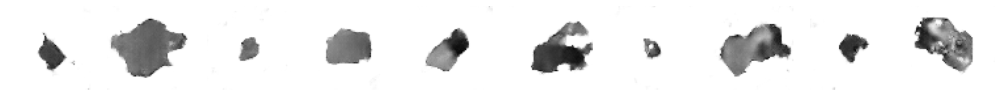

313/313 [==============================] - 31s 97ms/step - d_loss: -0.1988 - d_real_acc: 0.9148 - d_fake_acc: 0.9468 - d_acc: 0.9308 - g_loss: 7.0193 - g_acc: 0.0532
Epoch 116/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2680 - d_real_acc: 0.9290 - d_fake_acc: 0.9614 - d_acc: 0.9452 - g_loss: 6.7620 - g_acc: 0.0386
Saved to ./output/generated_img_115.png


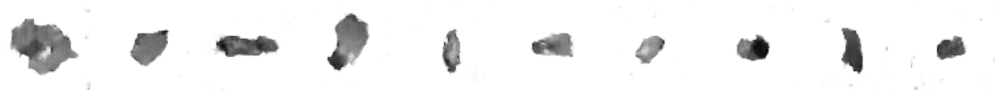

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2680 - d_real_acc: 0.9290 - d_fake_acc: 0.9614 - d_acc: 0.9452 - g_loss: 6.7620 - g_acc: 0.0386
Epoch 117/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2910 - d_real_acc: 0.9337 - d_fake_acc: 0.9641 - d_acc: 0.9489 - g_loss: 7.0822 - g_acc: 0.0359
Saved to ./output/generated_img_116.png


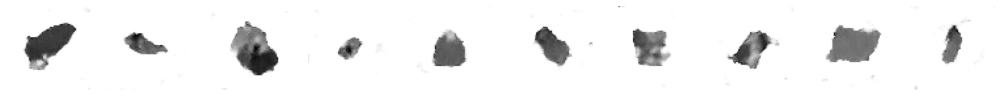

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2910 - d_real_acc: 0.9337 - d_fake_acc: 0.9641 - d_acc: 0.9489 - g_loss: 7.0822 - g_acc: 0.0359
Epoch 118/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3165 - d_real_acc: 0.9380 - d_fake_acc: 0.9690 - d_acc: 0.9535 - g_loss: 7.0098 - g_acc: 0.0310
Saved to ./output/generated_img_117.png


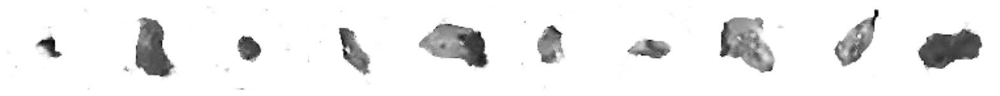

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3165 - d_real_acc: 0.9380 - d_fake_acc: 0.9690 - d_acc: 0.9535 - g_loss: 7.0098 - g_acc: 0.0310
Epoch 119/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3136 - d_real_acc: 0.9352 - d_fake_acc: 0.9645 - d_acc: 0.9498 - g_loss: 7.5165 - g_acc: 0.0355
Saved to ./output/generated_img_118.png


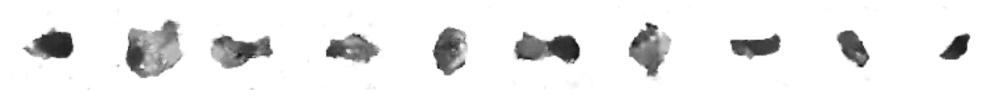

313/313 [==============================] - 30s 97ms/step - d_loss: -0.3136 - d_real_acc: 0.9352 - d_fake_acc: 0.9645 - d_acc: 0.9498 - g_loss: 7.5165 - g_acc: 0.0355
Epoch 120/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1841 - d_real_acc: 0.9164 - d_fake_acc: 0.9466 - d_acc: 0.9315 - g_loss: 6.8840 - g_acc: 0.0534
Saved to ./output/generated_img_119.png


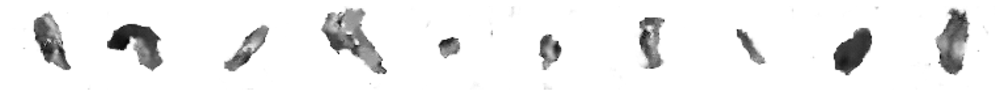

313/313 [==============================] - 30s 97ms/step - d_loss: -0.1841 - d_real_acc: 0.9164 - d_fake_acc: 0.9466 - d_acc: 0.9315 - g_loss: 6.8840 - g_acc: 0.0534
Epoch 121/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3537 - d_real_acc: 0.9456 - d_fake_acc: 0.9753 - d_acc: 0.9604 - g_loss: 7.2228 - g_acc: 0.0247
Saved to ./output/generated_img_120.png


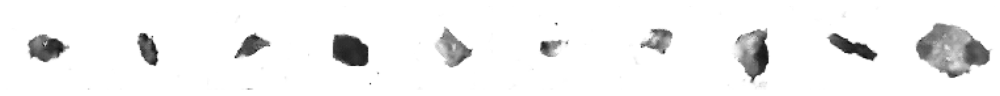

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3537 - d_real_acc: 0.9456 - d_fake_acc: 0.9753 - d_acc: 0.9604 - g_loss: 7.2228 - g_acc: 0.0247
Epoch 122/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1815 - d_real_acc: 0.9179 - d_fake_acc: 0.9495 - d_acc: 0.9337 - g_loss: 6.8331 - g_acc: 0.0505
Saved to ./output/generated_img_121.png


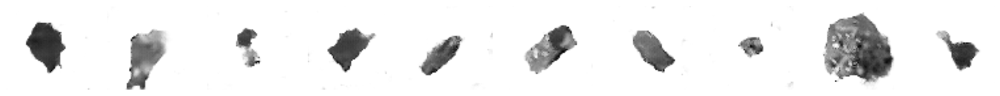

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1815 - d_real_acc: 0.9179 - d_fake_acc: 0.9495 - d_acc: 0.9337 - g_loss: 6.8331 - g_acc: 0.0505
Epoch 123/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1726 - d_real_acc: 0.9121 - d_fake_acc: 0.9440 - d_acc: 0.9280 - g_loss: 6.9763 - g_acc: 0.0560
Saved to ./output/generated_img_122.png


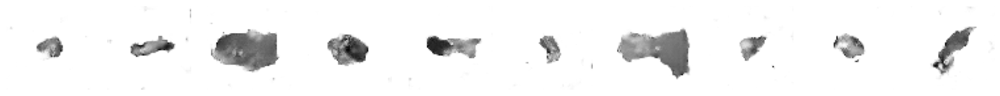

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1726 - d_real_acc: 0.9121 - d_fake_acc: 0.9440 - d_acc: 0.9280 - g_loss: 6.9763 - g_acc: 0.0560
Epoch 124/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3262 - d_real_acc: 0.9394 - d_fake_acc: 0.9708 - d_acc: 0.9551 - g_loss: 7.0347 - g_acc: 0.0292
Saved to ./output/generated_img_123.png


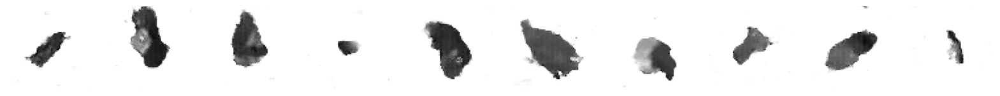

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3262 - d_real_acc: 0.9394 - d_fake_acc: 0.9708 - d_acc: 0.9551 - g_loss: 7.0347 - g_acc: 0.0292
Epoch 125/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2647 - d_real_acc: 0.9273 - d_fake_acc: 0.9593 - d_acc: 0.9433 - g_loss: 7.0700 - g_acc: 0.0407
Saved to ./output/generated_img_124.png


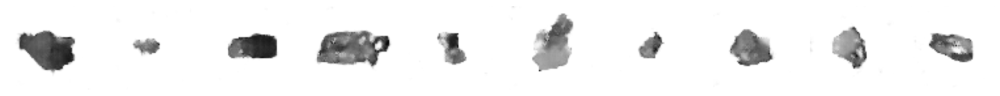

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2647 - d_real_acc: 0.9273 - d_fake_acc: 0.9593 - d_acc: 0.9433 - g_loss: 7.0700 - g_acc: 0.0407
Epoch 126/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2450 - d_real_acc: 0.9276 - d_fake_acc: 0.9587 - d_acc: 0.9431 - g_loss: 7.1381 - g_acc: 0.0413
Saved to ./output/generated_img_125.png


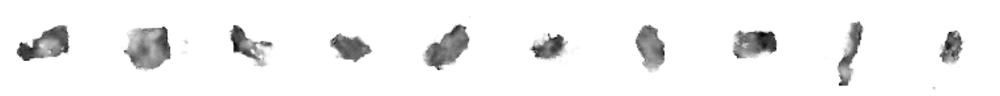

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2450 - d_real_acc: 0.9276 - d_fake_acc: 0.9587 - d_acc: 0.9431 - g_loss: 7.1381 - g_acc: 0.0413
Epoch 127/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2684 - d_real_acc: 0.9306 - d_fake_acc: 0.9657 - d_acc: 0.9481 - g_loss: 6.6450 - g_acc: 0.0343
Saved to ./output/generated_img_126.png


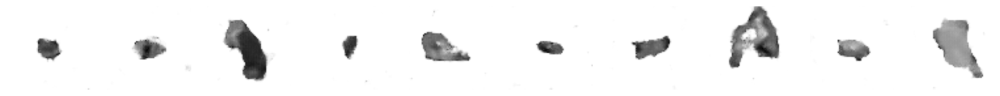

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2684 - d_real_acc: 0.9306 - d_fake_acc: 0.9657 - d_acc: 0.9481 - g_loss: 6.6450 - g_acc: 0.0343
Epoch 128/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2891 - d_real_acc: 0.9330 - d_fake_acc: 0.9624 - d_acc: 0.9477 - g_loss: 7.3177 - g_acc: 0.0376
Saved to ./output/generated_img_127.png


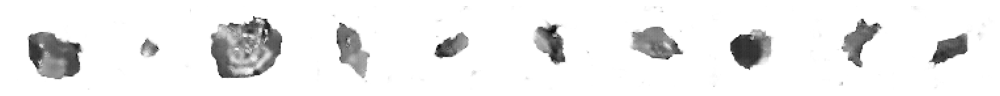

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2891 - d_real_acc: 0.9330 - d_fake_acc: 0.9624 - d_acc: 0.9477 - g_loss: 7.3177 - g_acc: 0.0376
Epoch 129/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3768 - d_real_acc: 0.9458 - d_fake_acc: 0.9734 - d_acc: 0.9596 - g_loss: 8.0207 - g_acc: 0.0266
Saved to ./output/generated_img_128.png


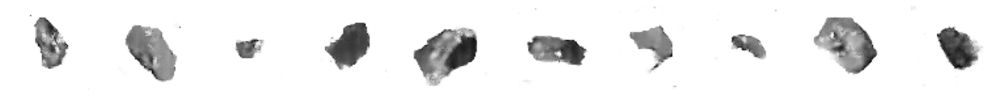

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3768 - d_real_acc: 0.9458 - d_fake_acc: 0.9734 - d_acc: 0.9596 - g_loss: 8.0207 - g_acc: 0.0266
Epoch 130/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3169 - d_real_acc: 0.9355 - d_fake_acc: 0.9632 - d_acc: 0.9493 - g_loss: 7.9806 - g_acc: 0.0368
Saved to ./output/generated_img_129.png


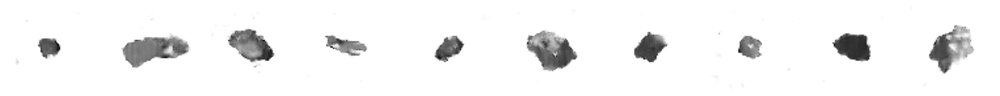

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3169 - d_real_acc: 0.9355 - d_fake_acc: 0.9632 - d_acc: 0.9493 - g_loss: 7.9806 - g_acc: 0.0368
Epoch 131/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2734 - d_real_acc: 0.9306 - d_fake_acc: 0.9608 - d_acc: 0.9457 - g_loss: 7.3209 - g_acc: 0.0392
Saved to ./output/generated_img_130.png


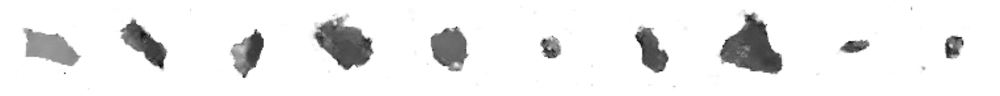

313/313 [==============================] - 30s 97ms/step - d_loss: -0.2734 - d_real_acc: 0.9306 - d_fake_acc: 0.9608 - d_acc: 0.9457 - g_loss: 7.3209 - g_acc: 0.0392
Epoch 132/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3189 - d_real_acc: 0.9366 - d_fake_acc: 0.9670 - d_acc: 0.9518 - g_loss: 7.5611 - g_acc: 0.0330
Saved to ./output/generated_img_131.png


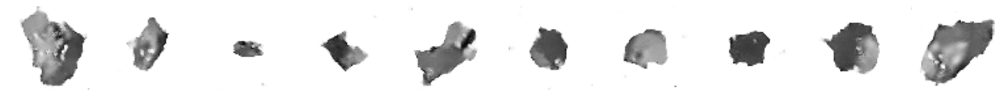

313/313 [==============================] - 30s 97ms/step - d_loss: -0.3189 - d_real_acc: 0.9366 - d_fake_acc: 0.9670 - d_acc: 0.9518 - g_loss: 7.5611 - g_acc: 0.0330
Epoch 133/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2751 - d_real_acc: 0.9296 - d_fake_acc: 0.9599 - d_acc: 0.9447 - g_loss: 7.4394 - g_acc: 0.0401
Saved to ./output/generated_img_132.png


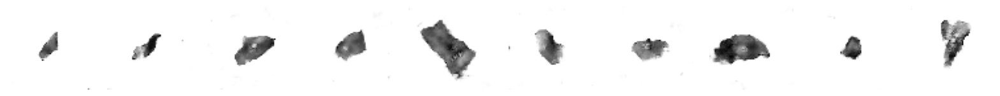

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2751 - d_real_acc: 0.9296 - d_fake_acc: 0.9599 - d_acc: 0.9447 - g_loss: 7.4394 - g_acc: 0.0401
Epoch 134/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3465 - d_real_acc: 0.9395 - d_fake_acc: 0.9678 - d_acc: 0.9537 - g_loss: 7.6735 - g_acc: 0.0322
Saved to ./output/generated_img_133.png


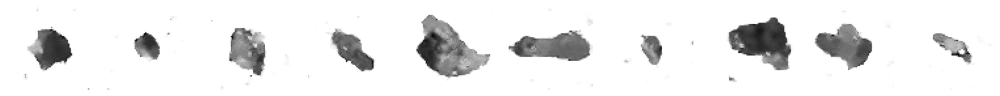

313/313 [==============================] - 30s 97ms/step - d_loss: -0.3465 - d_real_acc: 0.9395 - d_fake_acc: 0.9678 - d_acc: 0.9537 - g_loss: 7.6735 - g_acc: 0.0322
Epoch 135/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2921 - d_real_acc: 0.9314 - d_fake_acc: 0.9600 - d_acc: 0.9457 - g_loss: 7.6928 - g_acc: 0.0400
Saved to ./output/generated_img_134.png


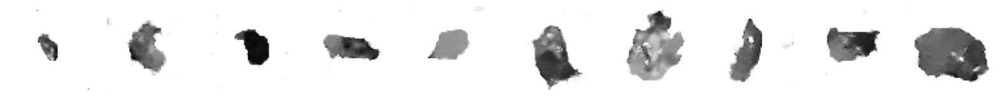

313/313 [==============================] - 31s 99ms/step - d_loss: -0.2921 - d_real_acc: 0.9314 - d_fake_acc: 0.9600 - d_acc: 0.9457 - g_loss: 7.6928 - g_acc: 0.0400
Epoch 136/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2396 - d_real_acc: 0.9255 - d_fake_acc: 0.9578 - d_acc: 0.9416 - g_loss: 7.5490 - g_acc: 0.0422
Saved to ./output/generated_img_135.png


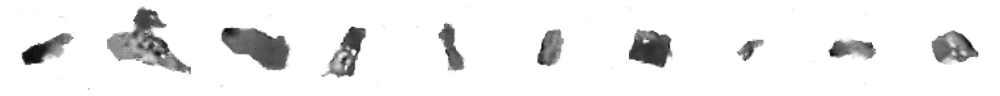

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2396 - d_real_acc: 0.9255 - d_fake_acc: 0.9578 - d_acc: 0.9416 - g_loss: 7.5490 - g_acc: 0.0422
Epoch 137/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3426 - d_real_acc: 0.9395 - d_fake_acc: 0.9669 - d_acc: 0.9532 - g_loss: 7.8231 - g_acc: 0.0331
Saved to ./output/generated_img_136.png


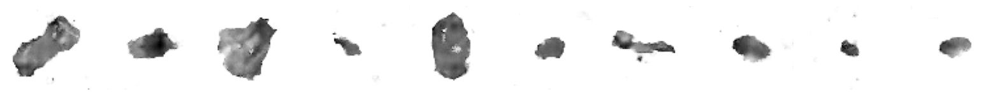

313/313 [==============================] - 31s 99ms/step - d_loss: -0.3426 - d_real_acc: 0.9395 - d_fake_acc: 0.9669 - d_acc: 0.9532 - g_loss: 7.8231 - g_acc: 0.0331
Epoch 138/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2905 - d_real_acc: 0.9319 - d_fake_acc: 0.9623 - d_acc: 0.9471 - g_loss: 7.4228 - g_acc: 0.0377
Saved to ./output/generated_img_137.png


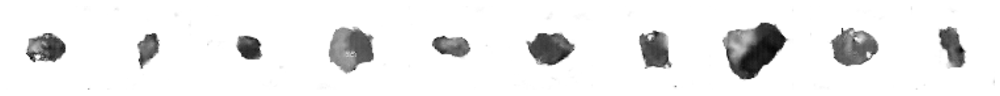

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2905 - d_real_acc: 0.9319 - d_fake_acc: 0.9623 - d_acc: 0.9471 - g_loss: 7.4228 - g_acc: 0.0377
Epoch 139/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2283 - d_real_acc: 0.9205 - d_fake_acc: 0.9491 - d_acc: 0.9348 - g_loss: 7.6534 - g_acc: 0.0509
Saved to ./output/generated_img_138.png


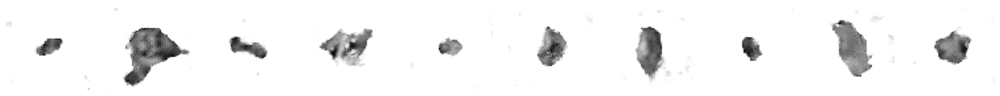

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2283 - d_real_acc: 0.9205 - d_fake_acc: 0.9491 - d_acc: 0.9348 - g_loss: 7.6534 - g_acc: 0.0509
Epoch 140/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3367 - d_real_acc: 0.9415 - d_fake_acc: 0.9706 - d_acc: 0.9560 - g_loss: 7.4569 - g_acc: 0.0294
Saved to ./output/generated_img_139.png


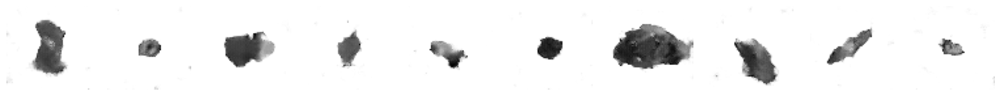

313/313 [==============================] - 30s 96ms/step - d_loss: -0.3367 - d_real_acc: 0.9415 - d_fake_acc: 0.9706 - d_acc: 0.9560 - g_loss: 7.4569 - g_acc: 0.0294
Epoch 141/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2308 - d_real_acc: 0.9205 - d_fake_acc: 0.9508 - d_acc: 0.9357 - g_loss: 7.4856 - g_acc: 0.0492
Saved to ./output/generated_img_140.png


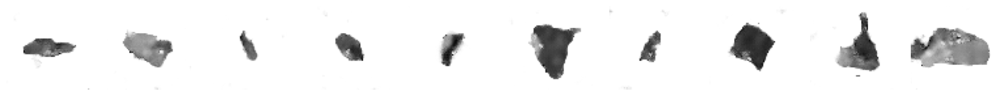

313/313 [==============================] - 30s 96ms/step - d_loss: -0.2308 - d_real_acc: 0.9205 - d_fake_acc: 0.9508 - d_acc: 0.9357 - g_loss: 7.4856 - g_acc: 0.0492
Epoch 142/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3375 - d_real_acc: 0.9406 - d_fake_acc: 0.9719 - d_acc: 0.9563 - g_loss: 7.4848 - g_acc: 0.0281
Saved to ./output/generated_img_141.png


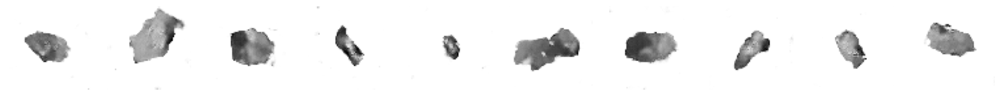

313/313 [==============================] - 30s 96ms/step - d_loss: -0.3375 - d_real_acc: 0.9406 - d_fake_acc: 0.9719 - d_acc: 0.9563 - g_loss: 7.4848 - g_acc: 0.0281
Epoch 143/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3694 - d_real_acc: 0.9447 - d_fake_acc: 0.9723 - d_acc: 0.9585 - g_loss: 8.0131 - g_acc: 0.0277
Saved to ./output/generated_img_142.png


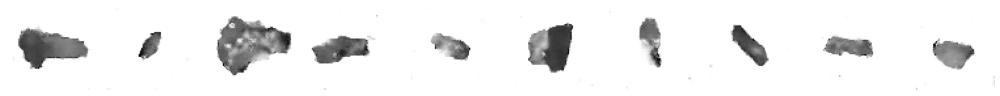

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3694 - d_real_acc: 0.9447 - d_fake_acc: 0.9723 - d_acc: 0.9585 - g_loss: 8.0131 - g_acc: 0.0277
Epoch 144/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3338 - d_real_acc: 0.9367 - d_fake_acc: 0.9644 - d_acc: 0.9506 - g_loss: 8.0238 - g_acc: 0.0356
Saved to ./output/generated_img_143.png


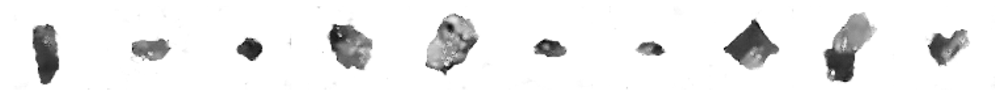

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3338 - d_real_acc: 0.9367 - d_fake_acc: 0.9644 - d_acc: 0.9506 - g_loss: 8.0238 - g_acc: 0.0356
Epoch 145/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3161 - d_real_acc: 0.9357 - d_fake_acc: 0.9657 - d_acc: 0.9507 - g_loss: 7.8824 - g_acc: 0.0343
Saved to ./output/generated_img_144.png


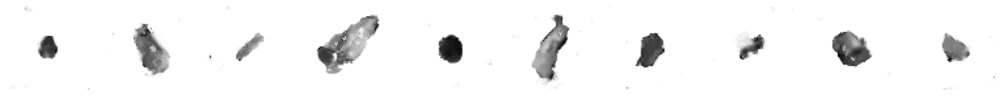

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3161 - d_real_acc: 0.9357 - d_fake_acc: 0.9657 - d_acc: 0.9507 - g_loss: 7.8824 - g_acc: 0.0343
Epoch 146/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3664 - d_real_acc: 0.9434 - d_fake_acc: 0.9717 - d_acc: 0.9575 - g_loss: 8.1045 - g_acc: 0.0283
Saved to ./output/generated_img_145.png


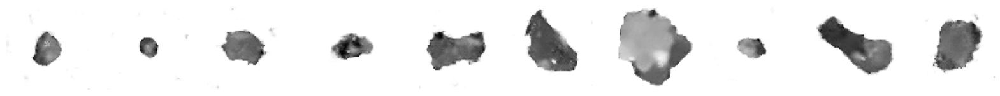

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3664 - d_real_acc: 0.9434 - d_fake_acc: 0.9717 - d_acc: 0.9575 - g_loss: 8.1045 - g_acc: 0.0283
Epoch 147/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3084 - d_real_acc: 0.9327 - d_fake_acc: 0.9610 - d_acc: 0.9469 - g_loss: 8.0156 - g_acc: 0.0390
Saved to ./output/generated_img_146.png


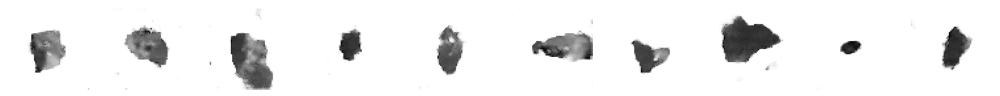

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3084 - d_real_acc: 0.9327 - d_fake_acc: 0.9610 - d_acc: 0.9469 - g_loss: 8.0156 - g_acc: 0.0390
Epoch 148/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4040 - d_real_acc: 0.9498 - d_fake_acc: 0.9783 - d_acc: 0.9641 - g_loss: 8.1038 - g_acc: 0.0216
Saved to ./output/generated_img_147.png


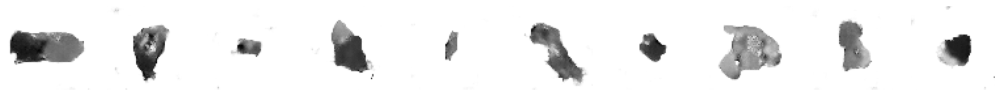

313/313 [==============================] - 31s 97ms/step - d_loss: -0.4040 - d_real_acc: 0.9498 - d_fake_acc: 0.9783 - d_acc: 0.9641 - g_loss: 8.1038 - g_acc: 0.0216
Epoch 149/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2063 - d_real_acc: 0.9189 - d_fake_acc: 0.9484 - d_acc: 0.9336 - g_loss: 7.4354 - g_acc: 0.0516
Saved to ./output/generated_img_148.png


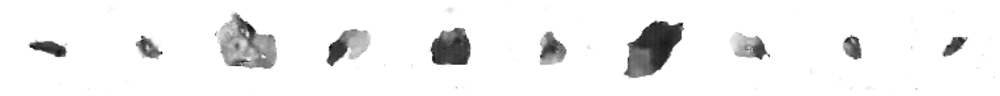

313/313 [==============================] - 31s 98ms/step - d_loss: -0.2063 - d_real_acc: 0.9189 - d_fake_acc: 0.9484 - d_acc: 0.9336 - g_loss: 7.4354 - g_acc: 0.0516
Epoch 150/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3909 - d_real_acc: 0.9484 - d_fake_acc: 0.9757 - d_acc: 0.9621 - g_loss: 8.2145 - g_acc: 0.0243
Saved to ./output/generated_img_149.png


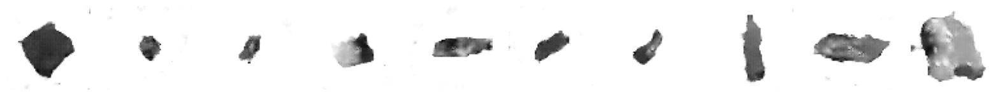

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3909 - d_real_acc: 0.9484 - d_fake_acc: 0.9757 - d_acc: 0.9621 - g_loss: 8.2145 - g_acc: 0.0243
Epoch 151/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3560 - d_real_acc: 0.9411 - d_fake_acc: 0.9681 - d_acc: 0.9546 - g_loss: 8.4051 - g_acc: 0.0319
Saved to ./output/generated_img_150.png


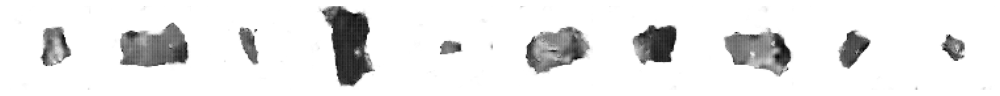

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3560 - d_real_acc: 0.9411 - d_fake_acc: 0.9681 - d_acc: 0.9546 - g_loss: 8.4051 - g_acc: 0.0319
Epoch 152/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2973 - d_real_acc: 0.9307 - d_fake_acc: 0.9582 - d_acc: 0.9445 - g_loss: 8.1711 - g_acc: 0.0418
Saved to ./output/generated_img_151.png


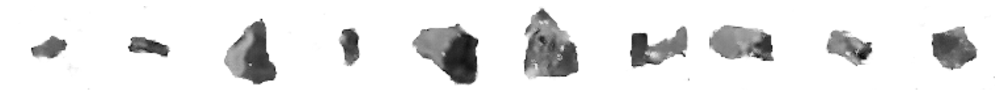

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2973 - d_real_acc: 0.9307 - d_fake_acc: 0.9582 - d_acc: 0.9445 - g_loss: 8.1711 - g_acc: 0.0418
Epoch 153/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3672 - d_real_acc: 0.9449 - d_fake_acc: 0.9721 - d_acc: 0.9585 - g_loss: 8.0960 - g_acc: 0.0279
Saved to ./output/generated_img_152.png


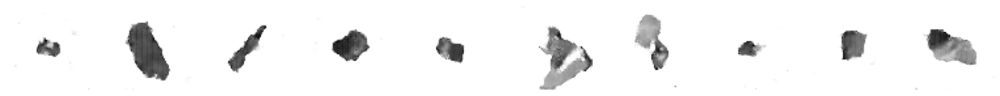

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3672 - d_real_acc: 0.9449 - d_fake_acc: 0.9721 - d_acc: 0.9585 - g_loss: 8.0960 - g_acc: 0.0279
Epoch 154/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2449 - d_real_acc: 0.9262 - d_fake_acc: 0.9565 - d_acc: 0.9414 - g_loss: 7.7723 - g_acc: 0.0435
Saved to ./output/generated_img_153.png


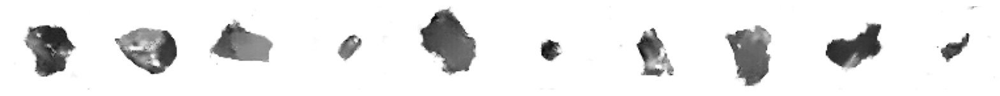

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2449 - d_real_acc: 0.9262 - d_fake_acc: 0.9565 - d_acc: 0.9414 - g_loss: 7.7723 - g_acc: 0.0435
Epoch 155/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3714 - d_real_acc: 0.9437 - d_fake_acc: 0.9708 - d_acc: 0.9573 - g_loss: 8.1407 - g_acc: 0.0291
Saved to ./output/generated_img_154.png


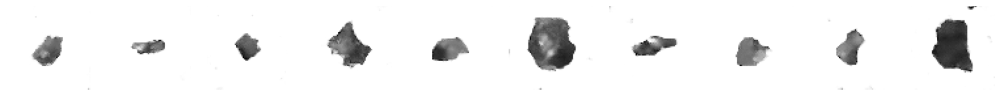

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3714 - d_real_acc: 0.9437 - d_fake_acc: 0.9708 - d_acc: 0.9573 - g_loss: 8.1407 - g_acc: 0.0291
Epoch 156/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3760 - d_real_acc: 0.9437 - d_fake_acc: 0.9703 - d_acc: 0.9570 - g_loss: 8.4293 - g_acc: 0.0298
Saved to ./output/generated_img_155.png


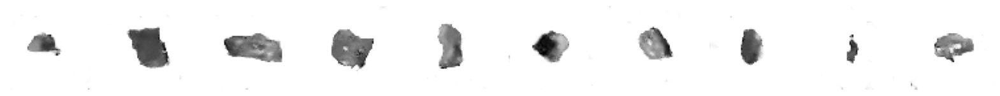

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3760 - d_real_acc: 0.9437 - d_fake_acc: 0.9703 - d_acc: 0.9570 - g_loss: 8.4293 - g_acc: 0.0298
Epoch 157/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3340 - d_real_acc: 0.9374 - d_fake_acc: 0.9656 - d_acc: 0.9515 - g_loss: 8.1730 - g_acc: 0.0344
Saved to ./output/generated_img_156.png


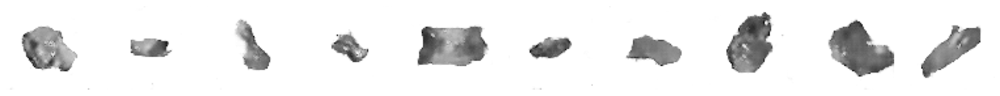

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3340 - d_real_acc: 0.9374 - d_fake_acc: 0.9656 - d_acc: 0.9515 - g_loss: 8.1730 - g_acc: 0.0344
Epoch 158/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3573 - d_real_acc: 0.9407 - d_fake_acc: 0.9652 - d_acc: 0.9530 - g_loss: 8.6011 - g_acc: 0.0348
Saved to ./output/generated_img_157.png


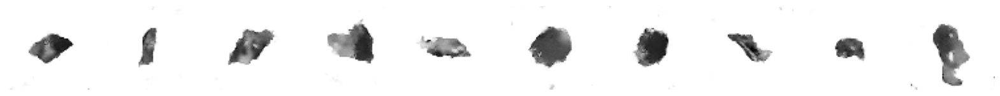

313/313 [==============================] - 31s 97ms/step - d_loss: -0.3573 - d_real_acc: 0.9407 - d_fake_acc: 0.9652 - d_acc: 0.9530 - g_loss: 8.6011 - g_acc: 0.0348
Epoch 159/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3326 - d_real_acc: 0.9385 - d_fake_acc: 0.9657 - d_acc: 0.9521 - g_loss: 8.1263 - g_acc: 0.0342
Saved to ./output/generated_img_158.png


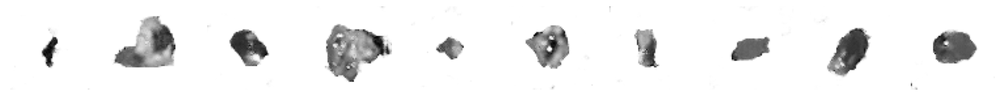

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3326 - d_real_acc: 0.9385 - d_fake_acc: 0.9657 - d_acc: 0.9521 - g_loss: 8.1263 - g_acc: 0.0342
Epoch 160/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2859 - d_real_acc: 0.9304 - d_fake_acc: 0.9592 - d_acc: 0.9448 - g_loss: 7.8285 - g_acc: 0.0408
Saved to ./output/generated_img_159.png


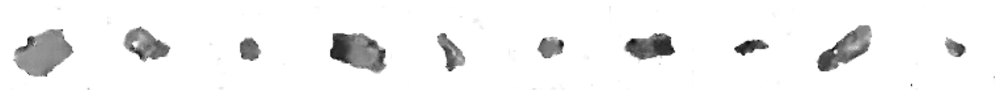

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2859 - d_real_acc: 0.9304 - d_fake_acc: 0.9592 - d_acc: 0.9448 - g_loss: 7.8285 - g_acc: 0.0408
Epoch 161/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2497 - d_real_acc: 0.9236 - d_fake_acc: 0.9517 - d_acc: 0.9376 - g_loss: 7.9341 - g_acc: 0.0483
Saved to ./output/generated_img_160.png


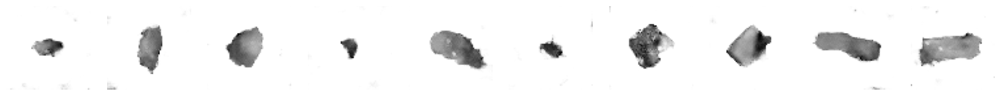

313/313 [==============================] - 31s 97ms/step - d_loss: -0.2497 - d_real_acc: 0.9236 - d_fake_acc: 0.9517 - d_acc: 0.9376 - g_loss: 7.9341 - g_acc: 0.0483
Epoch 162/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3906 - d_real_acc: 0.9492 - d_fake_acc: 0.9793 - d_acc: 0.9643 - g_loss: 7.8442 - g_acc: 0.0207
Saved to ./output/generated_img_161.png


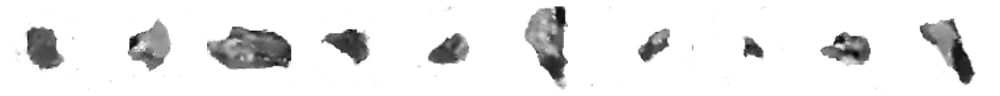

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3906 - d_real_acc: 0.9492 - d_fake_acc: 0.9793 - d_acc: 0.9643 - g_loss: 7.8442 - g_acc: 0.0207
Epoch 163/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3676 - d_real_acc: 0.9431 - d_fake_acc: 0.9702 - d_acc: 0.9567 - g_loss: 8.3707 - g_acc: 0.0298
Saved to ./output/generated_img_162.png


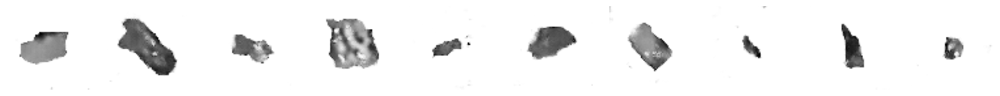

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3676 - d_real_acc: 0.9431 - d_fake_acc: 0.9702 - d_acc: 0.9567 - g_loss: 8.3707 - g_acc: 0.0298
Epoch 164/300
313/313 [==============================] - ETA: 0s - d_loss: -0.0961 - d_real_acc: 0.9054 - d_fake_acc: 0.9428 - d_acc: 0.9241 - g_loss: 7.1936 - g_acc: 0.0572
Saved to ./output/generated_img_163.png


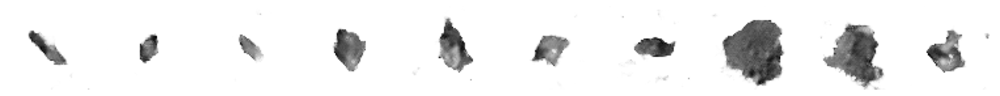

313/313 [==============================] - 31s 98ms/step - d_loss: -0.0961 - d_real_acc: 0.9054 - d_fake_acc: 0.9428 - d_acc: 0.9241 - g_loss: 7.1936 - g_acc: 0.0572
Epoch 165/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3068 - d_real_acc: 0.9355 - d_fake_acc: 0.9668 - d_acc: 0.9512 - g_loss: 7.3444 - g_acc: 0.0332
Saved to ./output/generated_img_164.png


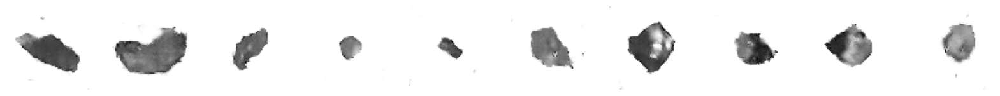

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3068 - d_real_acc: 0.9355 - d_fake_acc: 0.9668 - d_acc: 0.9512 - g_loss: 7.3444 - g_acc: 0.0332
Epoch 166/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4016 - d_real_acc: 0.9506 - d_fake_acc: 0.9749 - d_acc: 0.9628 - g_loss: 8.4523 - g_acc: 0.0251
Saved to ./output/generated_img_165.png


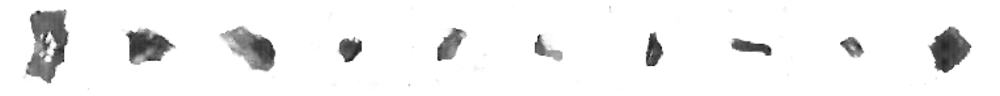

313/313 [==============================] - 31s 98ms/step - d_loss: -0.4016 - d_real_acc: 0.9506 - d_fake_acc: 0.9749 - d_acc: 0.9628 - g_loss: 8.4523 - g_acc: 0.0251
Epoch 167/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1949 - d_real_acc: 0.9178 - d_fake_acc: 0.9517 - d_acc: 0.9347 - g_loss: 7.8019 - g_acc: 0.0483
Saved to ./output/generated_img_166.png


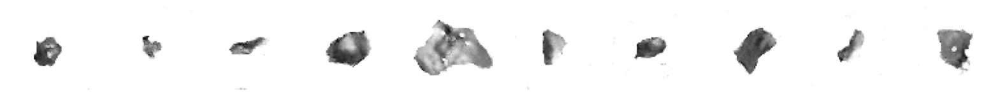

313/313 [==============================] - 31s 98ms/step - d_loss: -0.1949 - d_real_acc: 0.9178 - d_fake_acc: 0.9517 - d_acc: 0.9347 - g_loss: 7.8019 - g_acc: 0.0483
Epoch 168/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3584 - d_real_acc: 0.9438 - d_fake_acc: 0.9733 - d_acc: 0.9585 - g_loss: 7.9730 - g_acc: 0.0267
Saved to ./output/generated_img_167.png


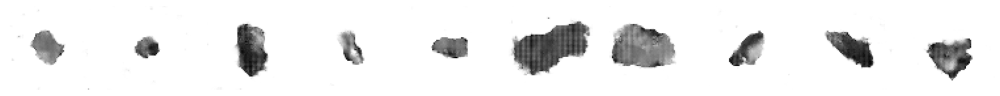

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3584 - d_real_acc: 0.9438 - d_fake_acc: 0.9733 - d_acc: 0.9585 - g_loss: 7.9730 - g_acc: 0.0267
Epoch 169/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3647 - d_real_acc: 0.9417 - d_fake_acc: 0.9675 - d_acc: 0.9546 - g_loss: 8.4031 - g_acc: 0.0325
Saved to ./output/generated_img_168.png


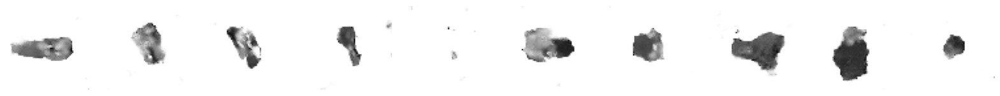

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3647 - d_real_acc: 0.9417 - d_fake_acc: 0.9675 - d_acc: 0.9546 - g_loss: 8.4031 - g_acc: 0.0325
Epoch 170/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3760 - d_real_acc: 0.9442 - d_fake_acc: 0.9712 - d_acc: 0.9577 - g_loss: 8.4747 - g_acc: 0.0288
Saved to ./output/generated_img_169.png


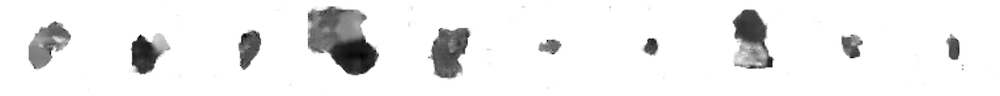

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3760 - d_real_acc: 0.9442 - d_fake_acc: 0.9712 - d_acc: 0.9577 - g_loss: 8.4747 - g_acc: 0.0288
Epoch 171/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4010 - d_real_acc: 0.9479 - d_fake_acc: 0.9747 - d_acc: 0.9613 - g_loss: 8.5991 - g_acc: 0.0253
Saved to ./output/generated_img_170.png


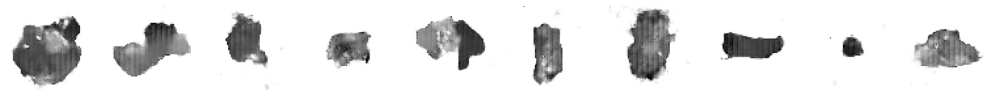

313/313 [==============================] - 31s 98ms/step - d_loss: -0.4010 - d_real_acc: 0.9479 - d_fake_acc: 0.9747 - d_acc: 0.9613 - g_loss: 8.5991 - g_acc: 0.0253
Epoch 172/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3593 - d_real_acc: 0.9408 - d_fake_acc: 0.9667 - d_acc: 0.9537 - g_loss: 8.7814 - g_acc: 0.0333
Saved to ./output/generated_img_171.png


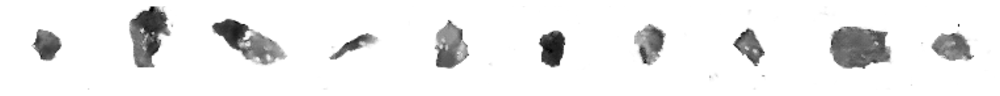

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3593 - d_real_acc: 0.9408 - d_fake_acc: 0.9667 - d_acc: 0.9537 - g_loss: 8.7814 - g_acc: 0.0333
Epoch 173/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3948 - d_real_acc: 0.9446 - d_fake_acc: 0.9708 - d_acc: 0.9577 - g_loss: 8.7235 - g_acc: 0.0292
Saved to ./output/generated_img_172.png


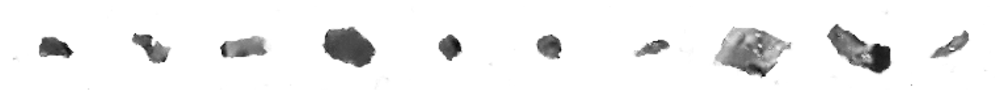

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3948 - d_real_acc: 0.9446 - d_fake_acc: 0.9708 - d_acc: 0.9577 - g_loss: 8.7235 - g_acc: 0.0292
Epoch 174/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3900 - d_real_acc: 0.9464 - d_fake_acc: 0.9736 - d_acc: 0.9600 - g_loss: 8.8729 - g_acc: 0.0264
Saved to ./output/generated_img_173.png


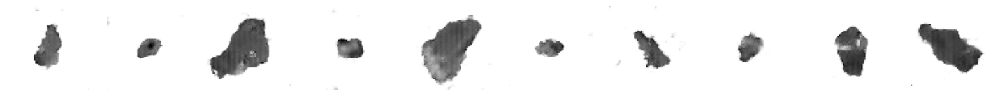

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3900 - d_real_acc: 0.9464 - d_fake_acc: 0.9736 - d_acc: 0.9600 - g_loss: 8.8729 - g_acc: 0.0264
Epoch 175/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3336 - d_real_acc: 0.9376 - d_fake_acc: 0.9688 - d_acc: 0.9532 - g_loss: 8.4145 - g_acc: 0.0312
Saved to ./output/generated_img_174.png


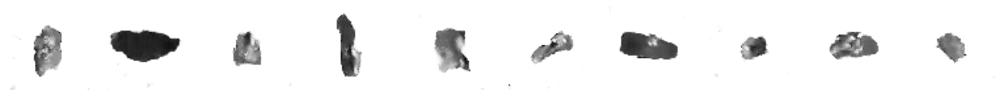

313/313 [==============================] - 31s 98ms/step - d_loss: -0.3336 - d_real_acc: 0.9376 - d_fake_acc: 0.9688 - d_acc: 0.9532 - g_loss: 8.4145 - g_acc: 0.0312
Epoch 176/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3413 - d_real_acc: 0.9380 - d_fake_acc: 0.9658 - d_acc: 0.9519 - g_loss: 8.4595 - g_acc: 0.0342
Saved to ./output/generated_img_175.png


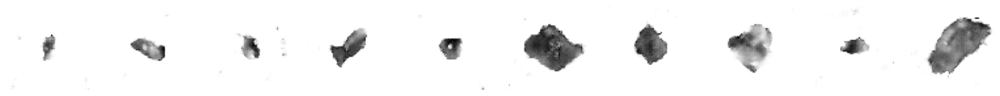

313/313 [==============================] - 31s 99ms/step - d_loss: -0.3413 - d_real_acc: 0.9380 - d_fake_acc: 0.9658 - d_acc: 0.9519 - g_loss: 8.4595 - g_acc: 0.0342
Epoch 177/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3182 - d_real_acc: 0.9362 - d_fake_acc: 0.9644 - d_acc: 0.9503 - g_loss: 8.0864 - g_acc: 0.0356
Saved to ./output/generated_img_176.png


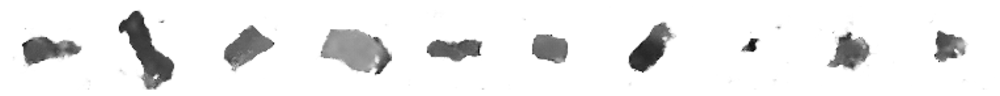

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3182 - d_real_acc: 0.9362 - d_fake_acc: 0.9644 - d_acc: 0.9503 - g_loss: 8.0864 - g_acc: 0.0356
Epoch 178/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4462 - d_real_acc: 0.9548 - d_fake_acc: 0.9781 - d_acc: 0.9664 - g_loss: 9.0346 - g_acc: 0.0219
Saved to ./output/generated_img_177.png


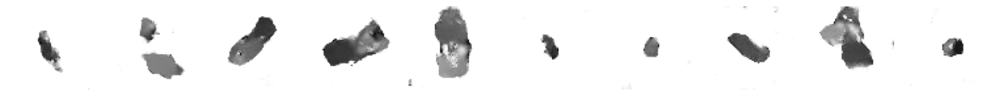

313/313 [==============================] - 31s 100ms/step - d_loss: -0.4462 - d_real_acc: 0.9548 - d_fake_acc: 0.9781 - d_acc: 0.9664 - g_loss: 9.0346 - g_acc: 0.0219
Epoch 179/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3846 - d_real_acc: 0.9428 - d_fake_acc: 0.9667 - d_acc: 0.9548 - g_loss: 9.1894 - g_acc: 0.0333
Saved to ./output/generated_img_178.png


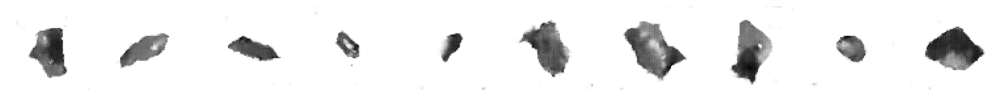

313/313 [==============================] - 32s 102ms/step - d_loss: -0.3846 - d_real_acc: 0.9428 - d_fake_acc: 0.9667 - d_acc: 0.9548 - g_loss: 9.1894 - g_acc: 0.0333
Epoch 180/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4302 - d_real_acc: 0.9517 - d_fake_acc: 0.9761 - d_acc: 0.9639 - g_loss: 8.9621 - g_acc: 0.0239
Saved to ./output/generated_img_179.png


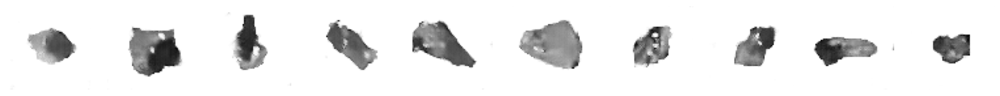

313/313 [==============================] - 32s 101ms/step - d_loss: -0.4302 - d_real_acc: 0.9517 - d_fake_acc: 0.9761 - d_acc: 0.9639 - g_loss: 8.9621 - g_acc: 0.0239
Epoch 181/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3121 - d_real_acc: 0.9327 - d_fake_acc: 0.9575 - d_acc: 0.9451 - g_loss: 8.8551 - g_acc: 0.0425
Saved to ./output/generated_img_180.png


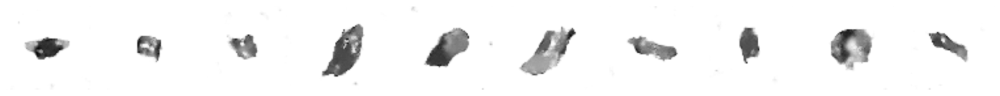

313/313 [==============================] - 32s 101ms/step - d_loss: -0.3121 - d_real_acc: 0.9327 - d_fake_acc: 0.9575 - d_acc: 0.9451 - g_loss: 8.8551 - g_acc: 0.0425
Epoch 182/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3914 - d_real_acc: 0.9458 - d_fake_acc: 0.9729 - d_acc: 0.9594 - g_loss: 8.5605 - g_acc: 0.0271
Saved to ./output/generated_img_181.png


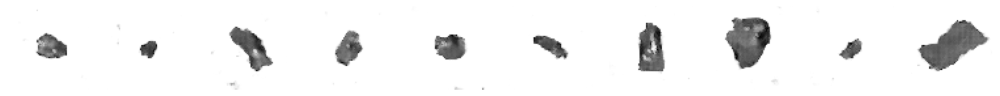

313/313 [==============================] - 32s 101ms/step - d_loss: -0.3914 - d_real_acc: 0.9458 - d_fake_acc: 0.9729 - d_acc: 0.9594 - g_loss: 8.5605 - g_acc: 0.0271
Epoch 183/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3769 - d_real_acc: 0.9444 - d_fake_acc: 0.9711 - d_acc: 0.9578 - g_loss: 8.6376 - g_acc: 0.0289
Saved to ./output/generated_img_182.png


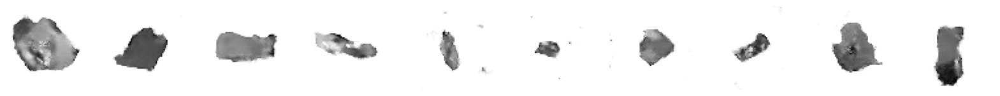

313/313 [==============================] - 32s 101ms/step - d_loss: -0.3769 - d_real_acc: 0.9444 - d_fake_acc: 0.9711 - d_acc: 0.9578 - g_loss: 8.6376 - g_acc: 0.0289
Epoch 184/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3610 - d_real_acc: 0.9403 - d_fake_acc: 0.9676 - d_acc: 0.9540 - g_loss: 8.7217 - g_acc: 0.0324
Saved to ./output/generated_img_183.png


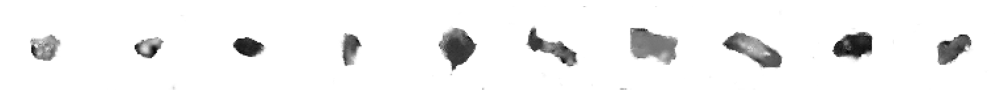

313/313 [==============================] - 32s 101ms/step - d_loss: -0.3610 - d_real_acc: 0.9403 - d_fake_acc: 0.9676 - d_acc: 0.9540 - g_loss: 8.7217 - g_acc: 0.0324
Epoch 185/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4597 - d_real_acc: 0.9557 - d_fake_acc: 0.9803 - d_acc: 0.9680 - g_loss: 9.0681 - g_acc: 0.0197
Saved to ./output/generated_img_184.png


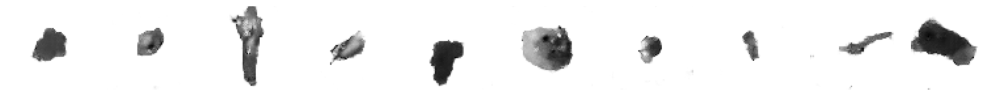

313/313 [==============================] - 31s 100ms/step - d_loss: -0.4597 - d_real_acc: 0.9557 - d_fake_acc: 0.9803 - d_acc: 0.9680 - g_loss: 9.0681 - g_acc: 0.0197
Epoch 186/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3047 - d_real_acc: 0.9327 - d_fake_acc: 0.9593 - d_acc: 0.9460 - g_loss: 8.9710 - g_acc: 0.0407
Saved to ./output/generated_img_185.png


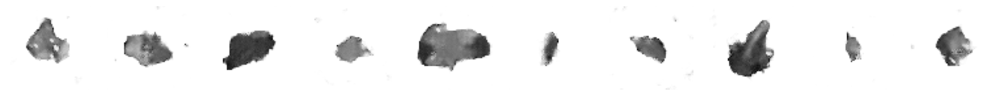

313/313 [==============================] - 31s 99ms/step - d_loss: -0.3047 - d_real_acc: 0.9327 - d_fake_acc: 0.9593 - d_acc: 0.9460 - g_loss: 8.9710 - g_acc: 0.0407
Epoch 187/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4304 - d_real_acc: 0.9519 - d_fake_acc: 0.9787 - d_acc: 0.9653 - g_loss: 8.7775 - g_acc: 0.0213
Saved to ./output/generated_img_186.png


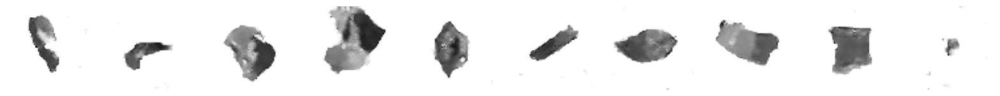

313/313 [==============================] - 31s 100ms/step - d_loss: -0.4304 - d_real_acc: 0.9519 - d_fake_acc: 0.9787 - d_acc: 0.9653 - g_loss: 8.7775 - g_acc: 0.0213
Epoch 188/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3849 - d_real_acc: 0.9448 - d_fake_acc: 0.9690 - d_acc: 0.9569 - g_loss: 9.2644 - g_acc: 0.0310
Saved to ./output/generated_img_187.png


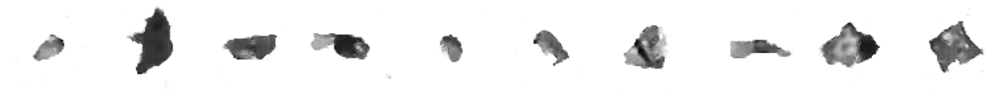

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3849 - d_real_acc: 0.9448 - d_fake_acc: 0.9690 - d_acc: 0.9569 - g_loss: 9.2644 - g_acc: 0.0310
Epoch 189/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3631 - d_real_acc: 0.9412 - d_fake_acc: 0.9677 - d_acc: 0.9545 - g_loss: 8.6722 - g_acc: 0.0323
Saved to ./output/generated_img_188.png


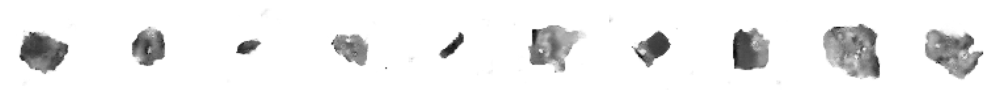

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3631 - d_real_acc: 0.9412 - d_fake_acc: 0.9677 - d_acc: 0.9545 - g_loss: 8.6722 - g_acc: 0.0323
Epoch 190/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3836 - d_real_acc: 0.9435 - d_fake_acc: 0.9695 - d_acc: 0.9565 - g_loss: 8.8617 - g_acc: 0.0305
Saved to ./output/generated_img_189.png


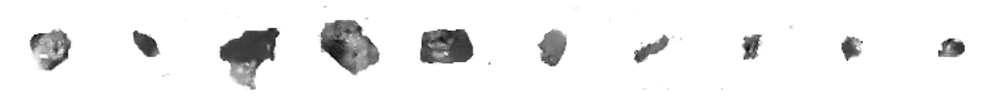

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3836 - d_real_acc: 0.9435 - d_fake_acc: 0.9695 - d_acc: 0.9565 - g_loss: 8.8617 - g_acc: 0.0305
Epoch 191/300
313/313 [==============================] - ETA: 0s - d_loss: -0.1890 - d_real_acc: 0.9150 - d_fake_acc: 0.9464 - d_acc: 0.9307 - g_loss: 8.2522 - g_acc: 0.0536
Saved to ./output/generated_img_190.png


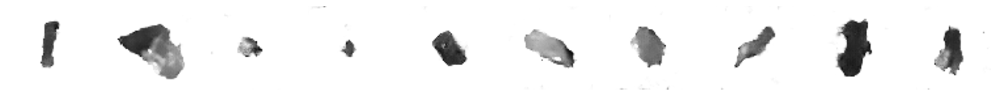

313/313 [==============================] - 31s 100ms/step - d_loss: -0.1890 - d_real_acc: 0.9150 - d_fake_acc: 0.9464 - d_acc: 0.9307 - g_loss: 8.2522 - g_acc: 0.0536
Epoch 192/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4410 - d_real_acc: 0.9538 - d_fake_acc: 0.9799 - d_acc: 0.9669 - g_loss: 8.9860 - g_acc: 0.0201
Saved to ./output/generated_img_191.png


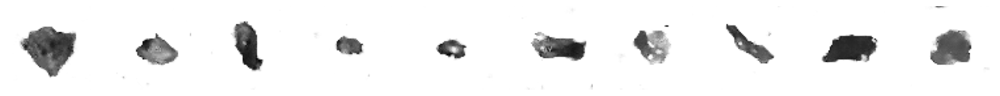

313/313 [==============================] - 31s 100ms/step - d_loss: -0.4410 - d_real_acc: 0.9538 - d_fake_acc: 0.9799 - d_acc: 0.9669 - g_loss: 8.9860 - g_acc: 0.0201
Epoch 193/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3734 - d_real_acc: 0.9448 - d_fake_acc: 0.9657 - d_acc: 0.9552 - g_loss: 9.0710 - g_acc: 0.0344
Saved to ./output/generated_img_192.png


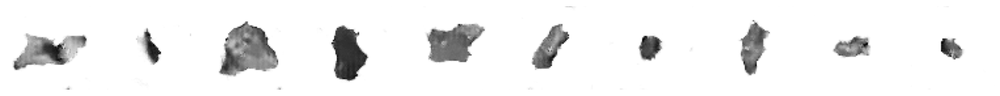

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3734 - d_real_acc: 0.9448 - d_fake_acc: 0.9657 - d_acc: 0.9552 - g_loss: 9.0710 - g_acc: 0.0344
Epoch 194/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3589 - d_real_acc: 0.9458 - d_fake_acc: 0.9705 - d_acc: 0.9582 - g_loss: 8.7321 - g_acc: 0.0295
Saved to ./output/generated_img_193.png


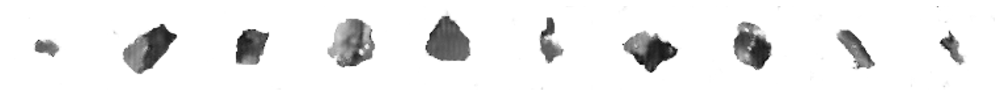

313/313 [==============================] - 32s 100ms/step - d_loss: -0.3589 - d_real_acc: 0.9458 - d_fake_acc: 0.9705 - d_acc: 0.9582 - g_loss: 8.7321 - g_acc: 0.0295
Epoch 195/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3573 - d_real_acc: 0.9410 - d_fake_acc: 0.9663 - d_acc: 0.9537 - g_loss: 8.9576 - g_acc: 0.0337
Saved to ./output/generated_img_194.png


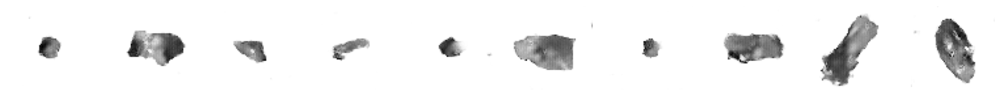

313/313 [==============================] - 32s 100ms/step - d_loss: -0.3573 - d_real_acc: 0.9410 - d_fake_acc: 0.9663 - d_acc: 0.9537 - g_loss: 8.9576 - g_acc: 0.0337
Epoch 196/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3324 - d_real_acc: 0.9373 - d_fake_acc: 0.9643 - d_acc: 0.9508 - g_loss: 8.4219 - g_acc: 0.0356
Saved to ./output/generated_img_195.png


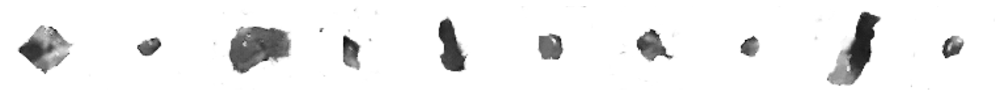

313/313 [==============================] - 31s 100ms/step - d_loss: -0.3324 - d_real_acc: 0.9373 - d_fake_acc: 0.9643 - d_acc: 0.9508 - g_loss: 8.4219 - g_acc: 0.0356
Epoch 197/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4180 - d_real_acc: 0.9488 - d_fake_acc: 0.9750 - d_acc: 0.9619 - g_loss: 8.9526 - g_acc: 0.0250
Saved to ./output/generated_img_196.png


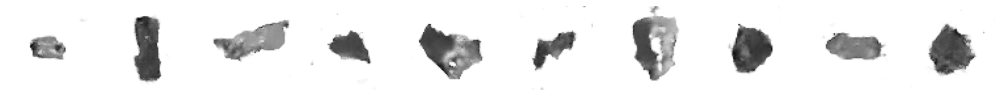

313/313 [==============================] - 32s 101ms/step - d_loss: -0.4180 - d_real_acc: 0.9488 - d_fake_acc: 0.9750 - d_acc: 0.9619 - g_loss: 8.9526 - g_acc: 0.0250
Epoch 198/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4076 - d_real_acc: 0.9480 - d_fake_acc: 0.9719 - d_acc: 0.9599 - g_loss: 9.0382 - g_acc: 0.0281
Saved to ./output/generated_img_197.png


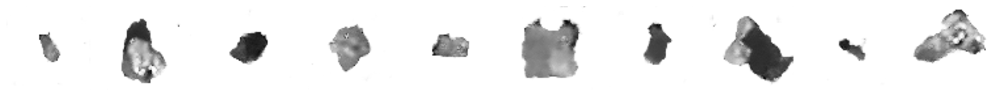

313/313 [==============================] - 32s 102ms/step - d_loss: -0.4076 - d_real_acc: 0.9480 - d_fake_acc: 0.9719 - d_acc: 0.9599 - g_loss: 9.0382 - g_acc: 0.0281
Epoch 199/300
313/313 [==============================] - ETA: 0s - d_loss: -0.2844 - d_real_acc: 0.9298 - d_fake_acc: 0.9546 - d_acc: 0.9422 - g_loss: 8.9213 - g_acc: 0.0454
Saved to ./output/generated_img_198.png


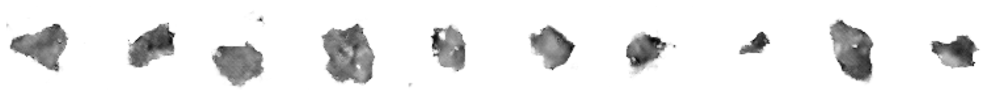

313/313 [==============================] - 32s 101ms/step - d_loss: -0.2844 - d_real_acc: 0.9298 - d_fake_acc: 0.9546 - d_acc: 0.9422 - g_loss: 8.9213 - g_acc: 0.0454
Epoch 200/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3263 - d_real_acc: 0.9380 - d_fake_acc: 0.9674 - d_acc: 0.9527 - g_loss: 8.1364 - g_acc: 0.0326
Saved to ./output/generated_img_199.png


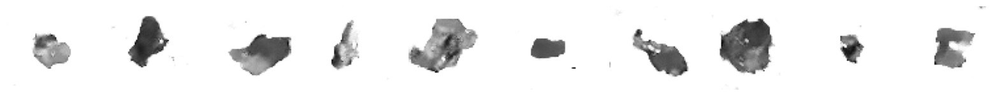

313/313 [==============================] - 32s 101ms/step - d_loss: -0.3263 - d_real_acc: 0.9380 - d_fake_acc: 0.9674 - d_acc: 0.9527 - g_loss: 8.1364 - g_acc: 0.0326
Epoch 201/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4112 - d_real_acc: 0.9469 - d_fake_acc: 0.9735 - d_acc: 0.9602 - g_loss: 8.8294 - g_acc: 0.0265
Saved to ./output/generated_img_200.png


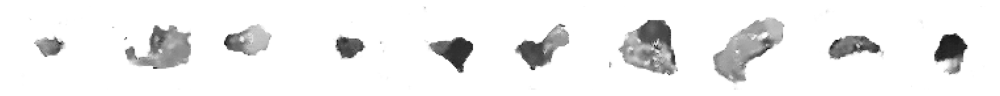

313/313 [==============================] - 31s 99ms/step - d_loss: -0.4112 - d_real_acc: 0.9469 - d_fake_acc: 0.9735 - d_acc: 0.9602 - g_loss: 8.8294 - g_acc: 0.0265
Epoch 202/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4196 - d_real_acc: 0.9490 - d_fake_acc: 0.9730 - d_acc: 0.9610 - g_loss: 9.2510 - g_acc: 0.0269
Saved to ./output/generated_img_201.png


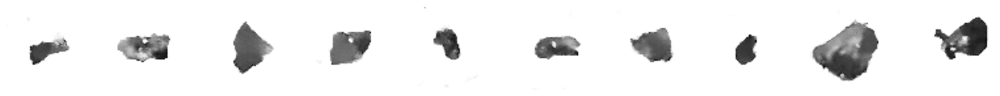

313/313 [==============================] - 29s 92ms/step - d_loss: -0.4196 - d_real_acc: 0.9490 - d_fake_acc: 0.9730 - d_acc: 0.9610 - g_loss: 9.2510 - g_acc: 0.0269
Epoch 203/300
313/313 [==============================] - ETA: 0s - d_loss: -0.3059 - d_real_acc: 0.9331 - d_fake_acc: 0.9602 - d_acc: 0.9467 - g_loss: 8.7769 - g_acc: 0.0398
Saved to ./output/generated_img_202.png


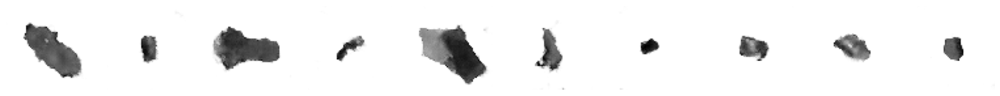

313/313 [==============================] - 29s 93ms/step - d_loss: -0.3059 - d_real_acc: 0.9331 - d_fake_acc: 0.9602 - d_acc: 0.9467 - g_loss: 8.7769 - g_acc: 0.0398
Epoch 204/300
312/313 [============================>.] - ETA: 0s - d_loss: -0.4503 - d_real_acc: 0.9561 - d_fake_acc: 0.9808 - d_acc: 0.9685 - g_loss: 9.0658 - g_acc: 0.0192
Saved to ./output/generated_img_203.png


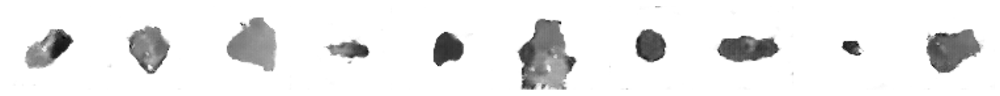

313/313 [==============================] - 29s 92ms/step - d_loss: -0.4507 - d_real_acc: 0.9561 - d_fake_acc: 0.9808 - d_acc: 0.9685 - g_loss: 9.0703 - g_acc: 0.0192
Epoch 205/300
312/313 [============================>.] - ETA: 0s - d_loss: -0.2822 - d_real_acc: 0.9306 - d_fake_acc: 0.9584 - d_acc: 0.9445 - g_loss: 8.5733 - g_acc: 0.0416
Saved to ./output/generated_img_204.png


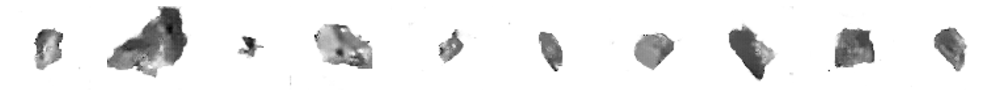

313/313 [==============================] - 29s 92ms/step - d_loss: -0.2824 - d_real_acc: 0.9305 - d_fake_acc: 0.9585 - d_acc: 0.9445 - g_loss: 8.5913 - g_acc: 0.0415
Epoch 206/300
313/313 [==============================] - ETA: 0s - d_loss: -0.4185 - d_real_acc: 0.9487 - d_fake_acc: 0.9720 - d_acc: 0.9603 - g_loss: 9.1618 - g_acc: 0.0280
Saved to ./output/generated_img_205.png


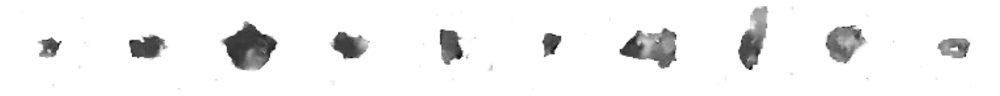

313/313 [==============================] - 30s 94ms/step - d_loss: -0.4185 - d_real_acc: 0.9487 - d_fake_acc: 0.9720 - d_acc: 0.9603 - g_loss: 9.1618 - g_acc: 0.0280
Epoch 207/300
281/313 [=========================>....] - ETA: 3s - d_loss: -0.4249 - d_real_acc: 0.9505 - d_fake_acc: 0.9731 - d_acc: 0.9618 - g_loss: 9.3405 - g_acc: 0.0269

KeyboardInterrupt: 

In [14]:
dcgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [ ]:
# Save the final models
generator.save("./models/generator")
discriminator.save("./models/discriminator")

## 3. Generate new images <a name="decode"></a>

In [ ]:
# Sample some points in the latent space, from the standard normal distribution
grid_width, grid_height = (10, 3)
z_sample = np.random.normal(size=(grid_width * grid_height, Z_DIM))

In [ ]:
# Decode the sampled points
reconstructions = generator.predict(z_sample)

In [ ]:
# Draw a plot of decoded images
fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Output the grid of faces
for i in range(grid_width * grid_height):
    ax = fig.add_subplot(grid_height, grid_width, i + 1)
    ax.axis("off")
    ax.imshow(reconstructions[i, :, :], cmap="Greys")

In [ ]:
def compare_images(img1, img2):
    return np.mean(np.abs(img1 - img2))

In [ ]:
all_data = []
for i in train.as_numpy_iterator():
    all_data.extend(i)
all_data = np.array(all_data)

In [ ]:
r, c = 3, 5
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Generated images", fontsize=20)

noise = np.random.normal(size=(r * c, Z_DIM))
gen_imgs = generator.predict(noise)

cnt = 0
for i in range(r):
    for j in range(c):
        axs[i, j].imshow(gen_imgs[cnt], cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()

In [ ]:
fig, axs = plt.subplots(r, c, figsize=(10, 6))
fig.suptitle("Closest images in the training set", fontsize=20)

cnt = 0
for i in range(r):
    for j in range(c):
        c_diff = 99999
        c_img = None
        for k_idx, k in enumerate(all_data):
            diff = compare_images(gen_imgs[cnt], k)
            if diff < c_diff:
                c_img = np.copy(k)
                c_diff = diff
        axs[i, j].imshow(c_img, cmap="gray_r")
        axs[i, j].axis("off")
        cnt += 1

plt.show()